In [19]:
import os
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [20]:
os.listdir(".")

['lrange_no_pipeline.png',
 'GET',
 'run_redis_benchmark.sh',
 'set_no_pipeline.png',
 'MSET',
 'LRANGE',
 'HSET',
 'get_3_payload_5_pipeline.png',
 'bindMountResults',
 'volumeResults',
 '.git',
 'lpush_1000_payload_10_pipeline_36_client.png',
 '.ipynb_checkpoints',
 'hset_100_payload_no_pipeline_12_client.png',
 'LPUSH',
 'processData.ipynb',
 'SET',
 'mset_1000_payload_5_pipeline_24_client.png',
 'localResults']

In [21]:
folders = ["localResults", "volumeResults", "bindMountResults"]
types = ["SET", "GET", "HSET", "LPUSH", "LRANGE", "MSET"]
width = 0.18
ind = np.arange(4)

def autolabel(rects, ax):
    for rect in rects:
        h = rect.get_height()
        ax.text(rect.get_x()+rect.get_width()/2., 1.05*h, '%d'%h,
                ha='center', va='bottom', rotation=45)

def plotData(local, volume, bind, payload, pipeline, clientThread):
    for i in range(len(local[0])):
        xvals = []
        yvals = []
        zvals = []
        for j in range(4):
            xvals.append(int(1000000/local[j][i]))
            yvals.append(int(1000000/volume[j][i]))
            zvals.append(int(1000000/bind[j][i]))
        
        fig = plt.figure(figsize=(18, 8))
        ax = fig.add_subplot(111)
        rects1 = ax.bar(ind, xvals, width, color='tab:blue')
        rects2 = ax.bar([i+width for i in ind], yvals, width, color='tab:orange')
        rects3 = ax.bar([i+width*2 for i in ind], zvals, width, color='tab:green')
        ax.set_xlabel("Number of IO threads")
        ax.set_ylabel("Requests per second")
        ax.set_xticks([i+width for i in ind])
        ax.set_xticklabels((1,2,4,8))
        ax.legend((rects1[0], rects2[0], rects3[0]), ("local", "volumes", "bind_mount"))
        plt.title(types[i] + " - " + payload + "-Payload " + pipeline + "-Pipeline " + clientThread + "-Client Threads")
        autolabel(rects1, ax)
        autolabel(rects2, ax)
        autolabel(rects3, ax)
        plt.margins(0.14)
        plt.savefig(types[i]+"/payload_"+payload+"_pipeline_"+pipeline+"thread_"+clientThread+".png")
        plt.show()

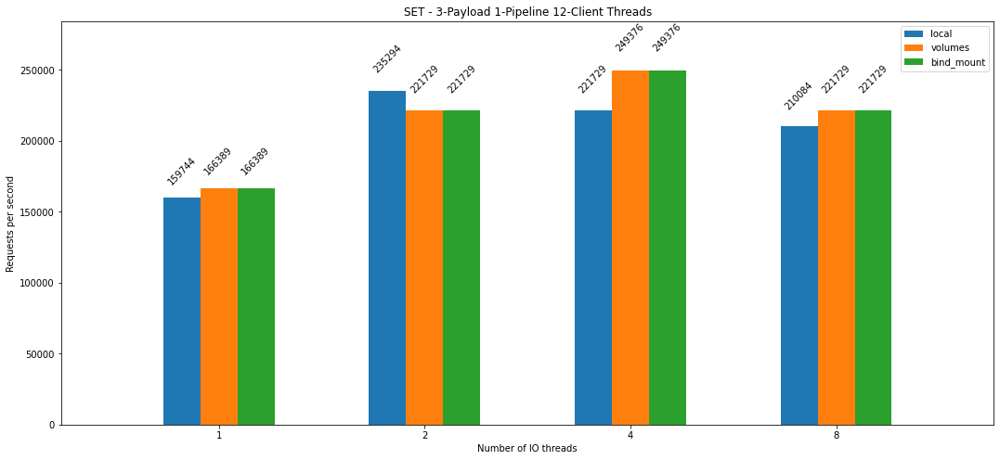

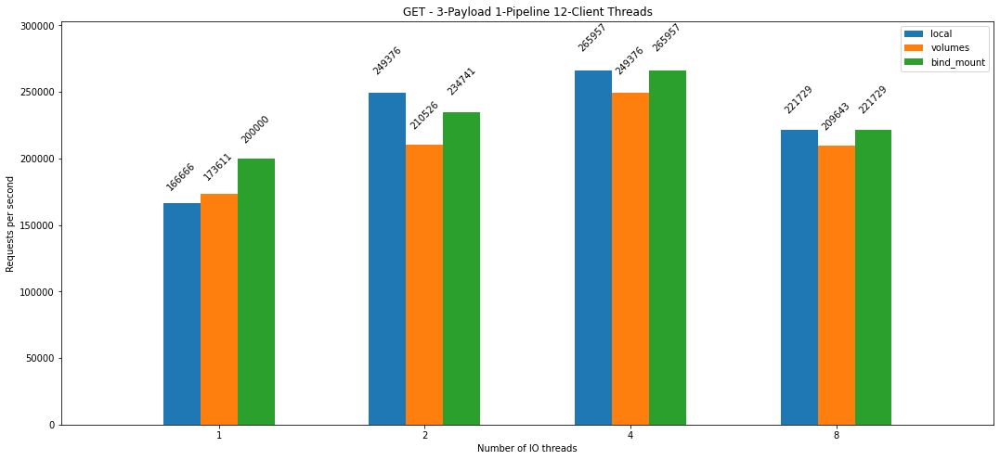

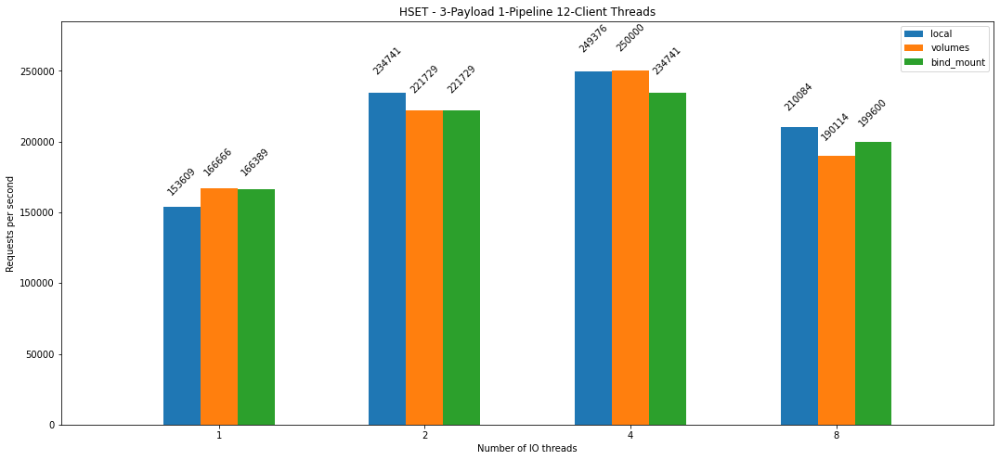

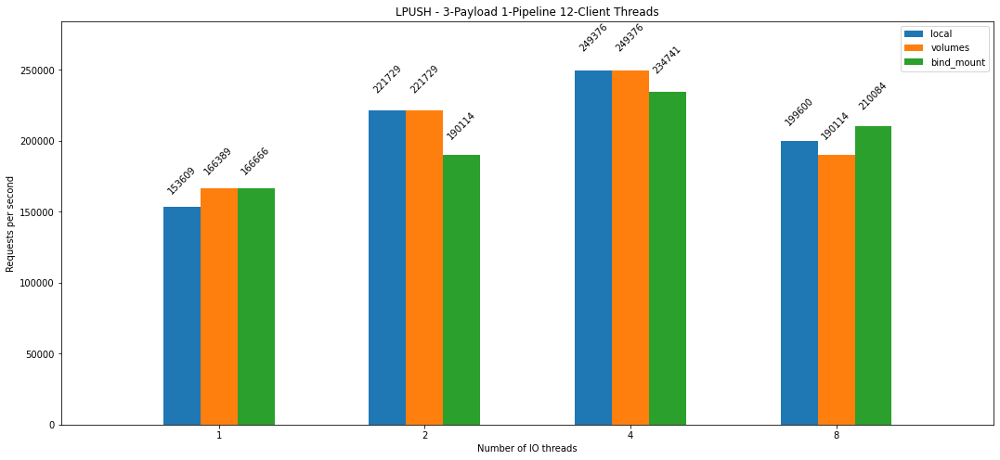

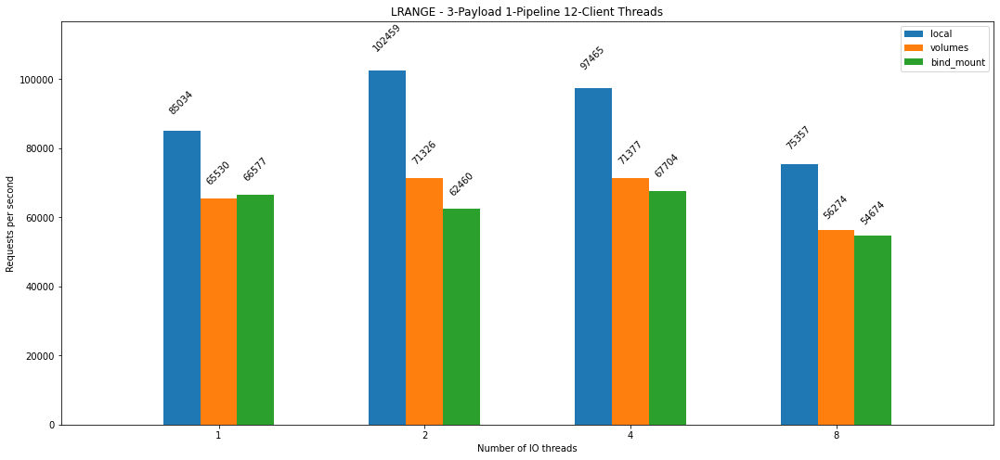

...

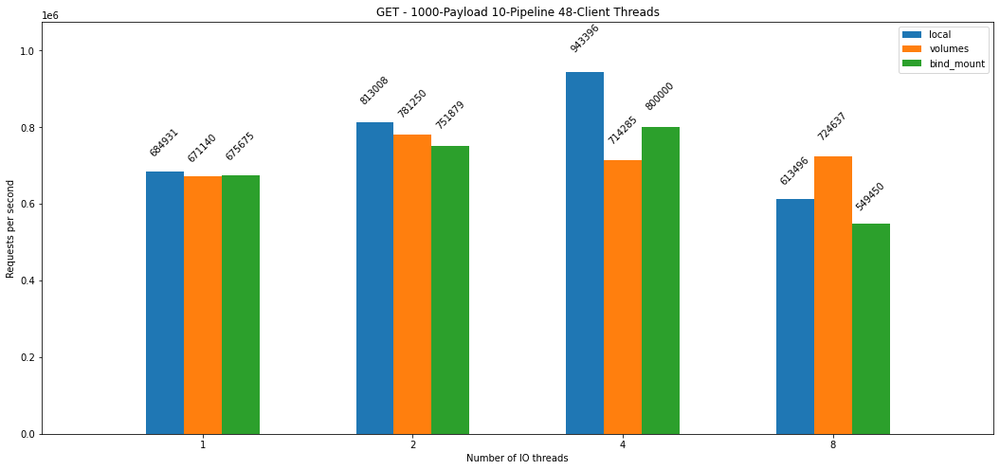

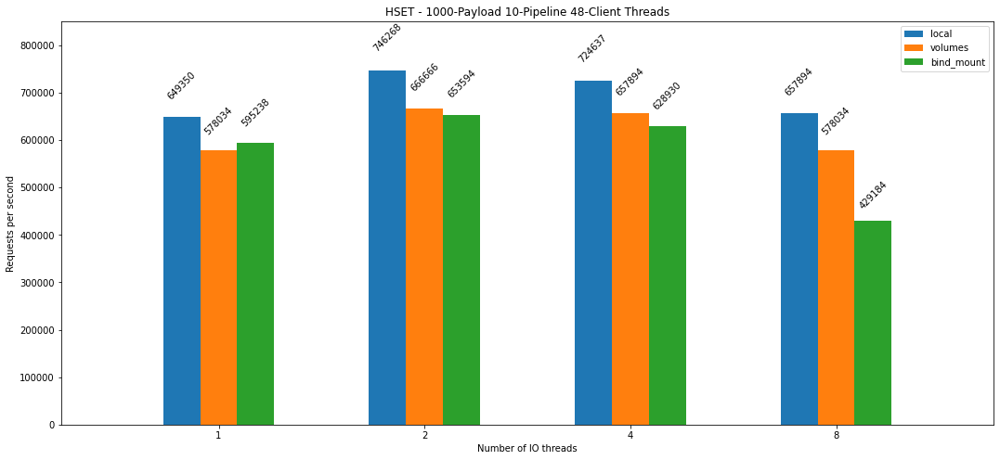

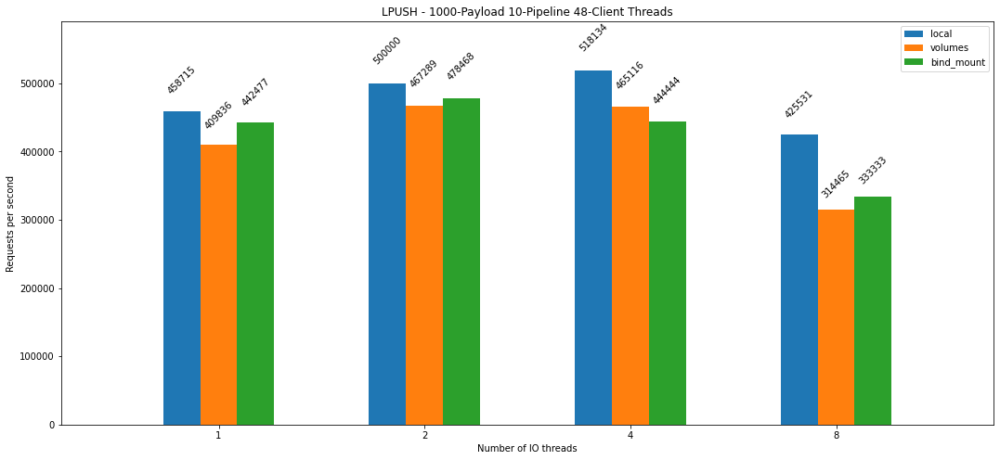

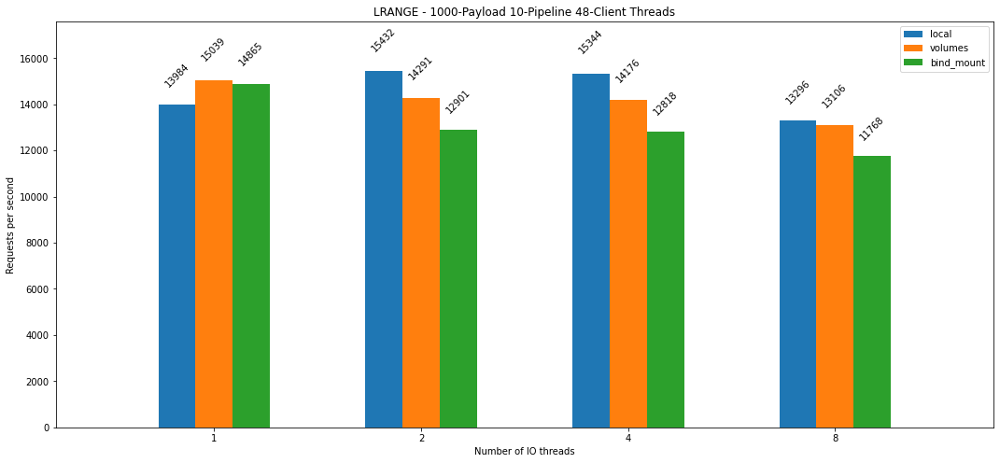

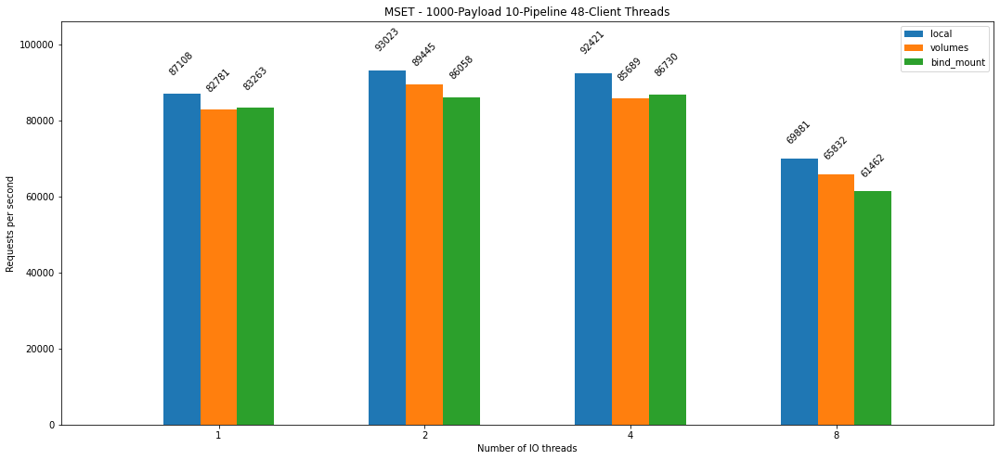

In [22]:
threads = ["1", "2", "4", "8"]

for payload in ["3", "100", "1000"]:
    for th in ["12","24","36","48"]:
        for pipeline in ["1", "5", "10"]:
            local = []
            volumes = []
            bindMounts = []
            for i in range(len(threads)):
                fileName = "iothreads_{}_pipeline_{}_connections_{}_payload_{}_threads_{}.txt".format(threads[i], pipeline, "512", payload, th)
                local.append([])
                volumes.append([])
                bindMounts.append([])
                for folder in folders:
                    if folder=="localResults":
                        with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                            readThis = False
                            for line in f:
                                if readThis:
                                    data = line.split(" ")
                                    local[-1].append(float(data[6]))
                                    readThis=False
                                if "======" in line:
                                    readThis = True
                    elif folder=="volumeResults":
                        with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                            readThis = False
                            for line in f:
                                if readThis:
                                    data = line.split(" ")
                                    volumes[-1].append(float(data[6]))
                                    readThis=False
                                if "======" in line:
                                    readThis = True
                    elif folder=="bindMountResults":
                        with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                            readThis = False
                            for line in f:
                                if readThis:
                                    data = line.split(" ")
                                    bindMounts[-1].append(float(data[6]))
                                    readThis=False
                                if "======" in line:
                                    readThis = True
            plotData(local, volumes, bindMounts, payload, pipeline, th)

In [31]:
folders = ["localResults", "volumeResults", "bindMountResults"]
types = ["SET", "GET", "HSET", "LPUSH", "LRANGE", "MSET"]
width = 0.18
ind = np.arange(4)

def autolabel(rects, ax):
    for rect in rects:
        h = rect.get_height()
        ax.text(rect.get_x()+rect.get_width()/2., 1.05*h, '%.d'%int(h),
                ha='center', va='bottom', rotation=45)

def plotData(local, volume, bind, th, payload, pipeline):
    print(th)
    for i in range(len(local[0])):
        xvals = []
        yvals = []
        zvals = []
        for j in range(4):
            xvals.append(local[j][i])
            yvals.append(volume[j][i])
            zvals.append(bind[j][i])
        
        fig = plt.figure(figsize=(18, 10))
        ax = fig.add_subplot(111)
        rects1 = ax.bar(ind, xvals, width, color='tab:blue')
        rects2 = ax.bar([i+width for i in ind], yvals, width, color='tab:orange')
        rects3 = ax.bar([i+width*2 for i in ind], zvals, width, color='tab:green')
        ax.set_xlabel("Number of IO threads")
        ax.set_ylabel("Requests per second")
        ax.set_xticks([i+width for i in ind])
        ax.set_xticklabels((1,2,4,8))
        ax.legend((rects1[0], rects2[0], rects3[0]), ("local", "volumes", "bind_mount"))
        plt.title(types[i] + " - " + payload + "-Payload " + pipeline + "-Pipeline")
        autolabel(rects1, ax)
        autolabel(rects2, ax)
        autolabel(rects3, ax)
        plt.margins(0.14)
        plt.show()

8


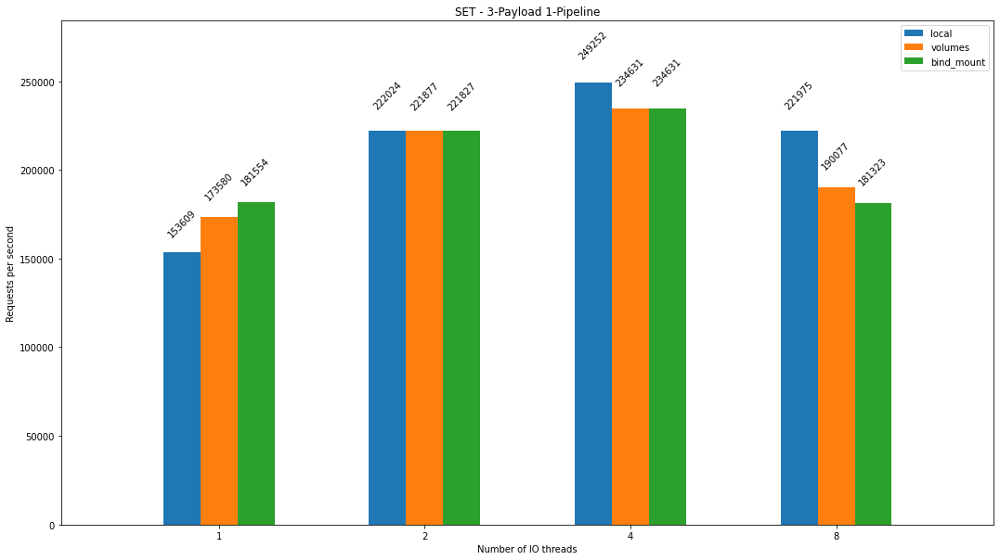

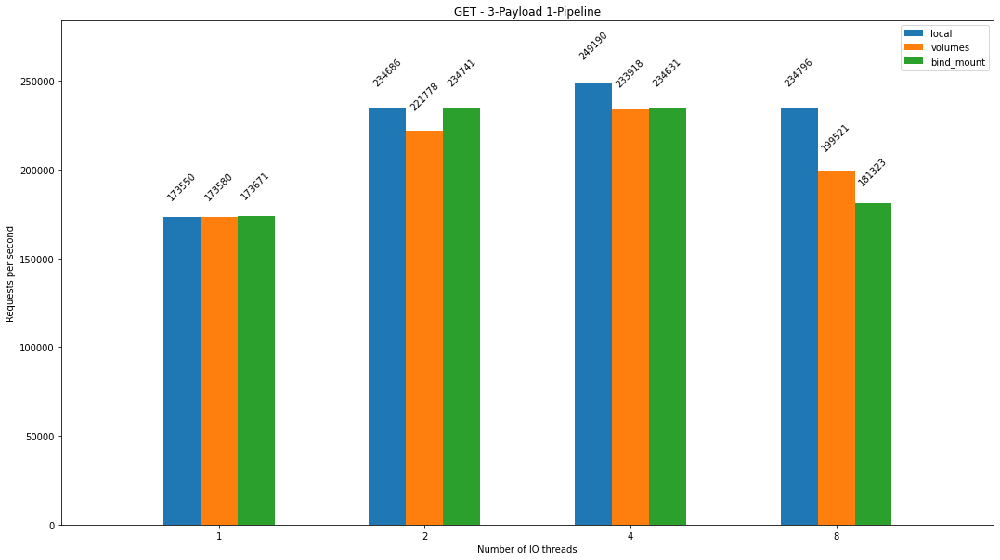

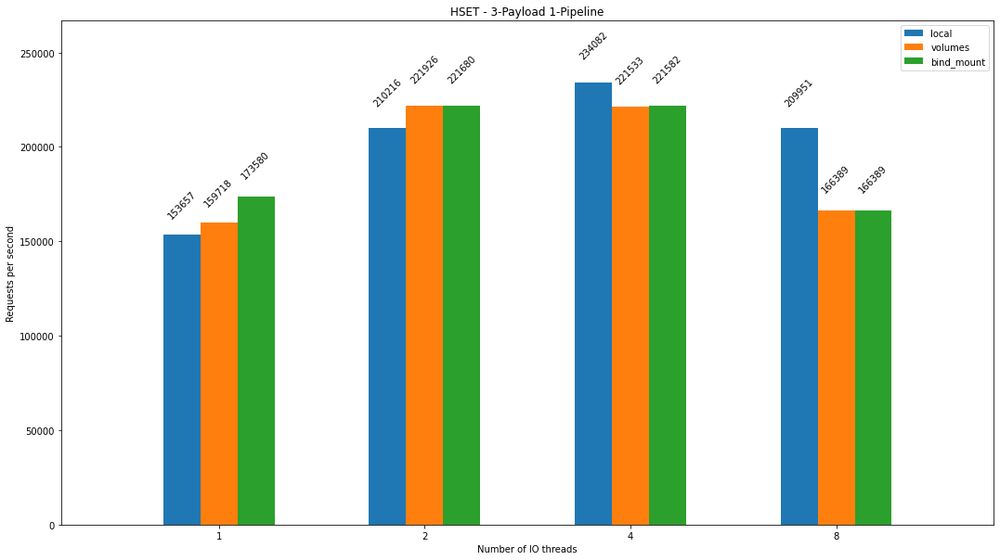

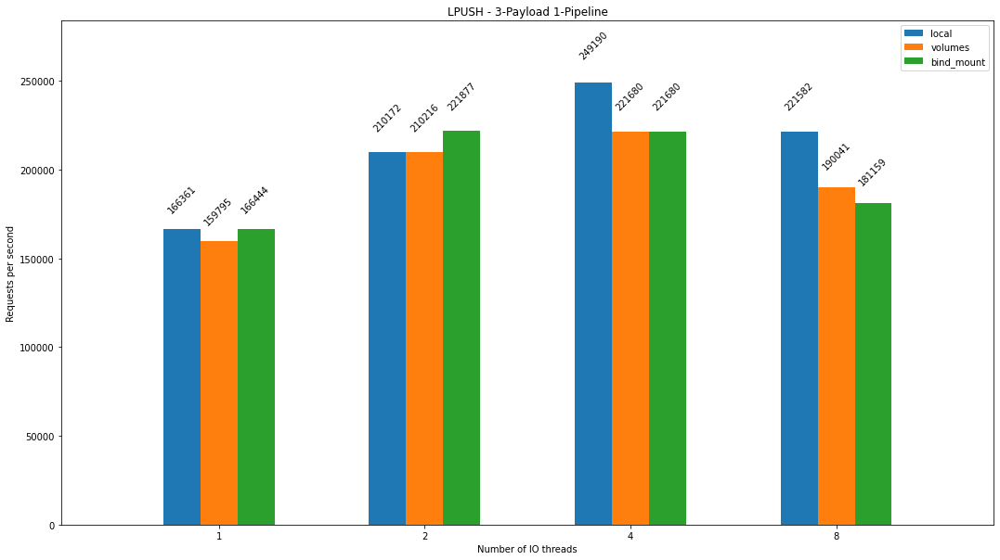

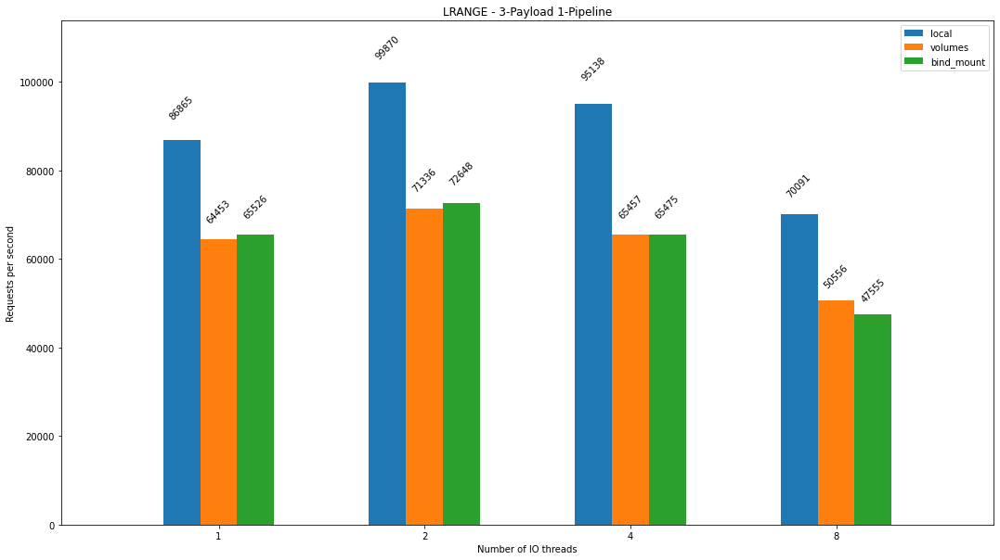

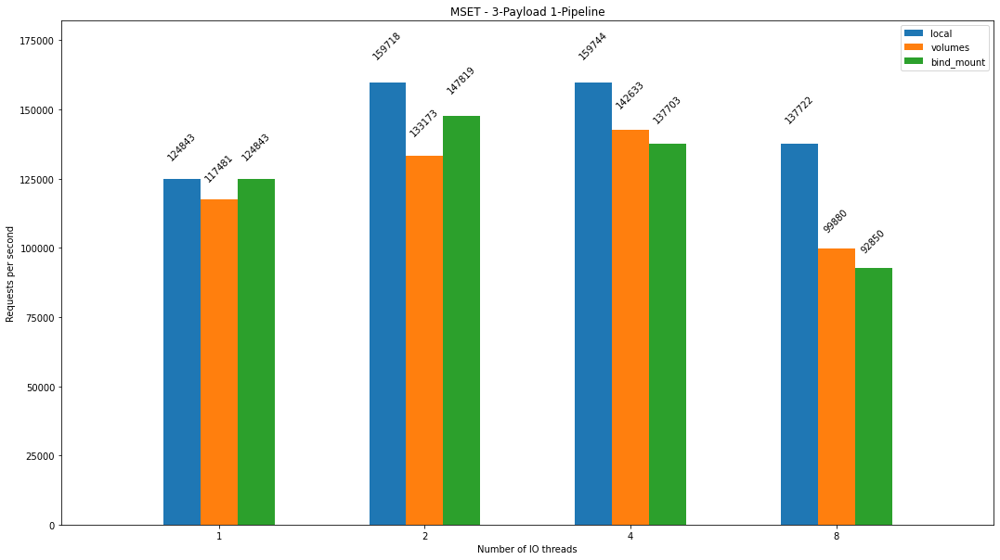

8


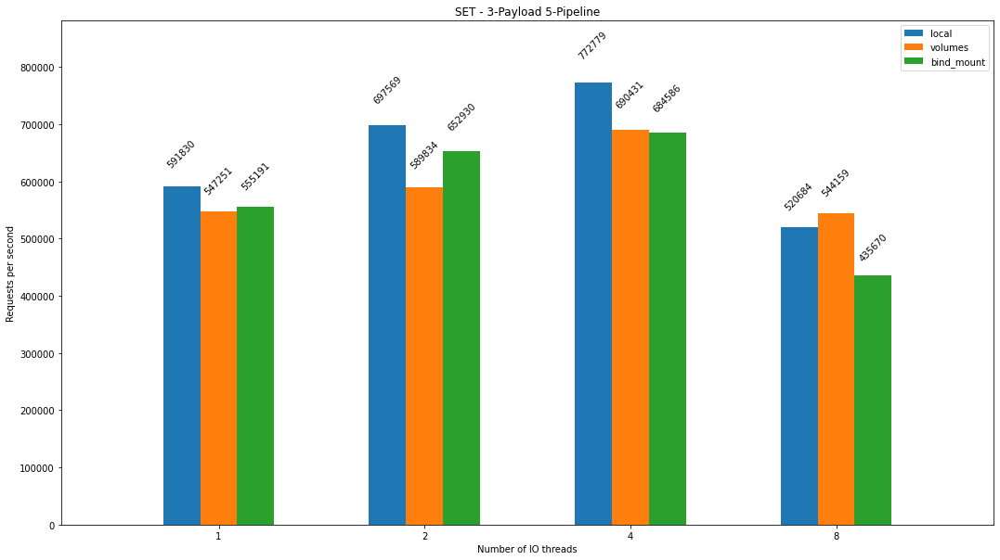

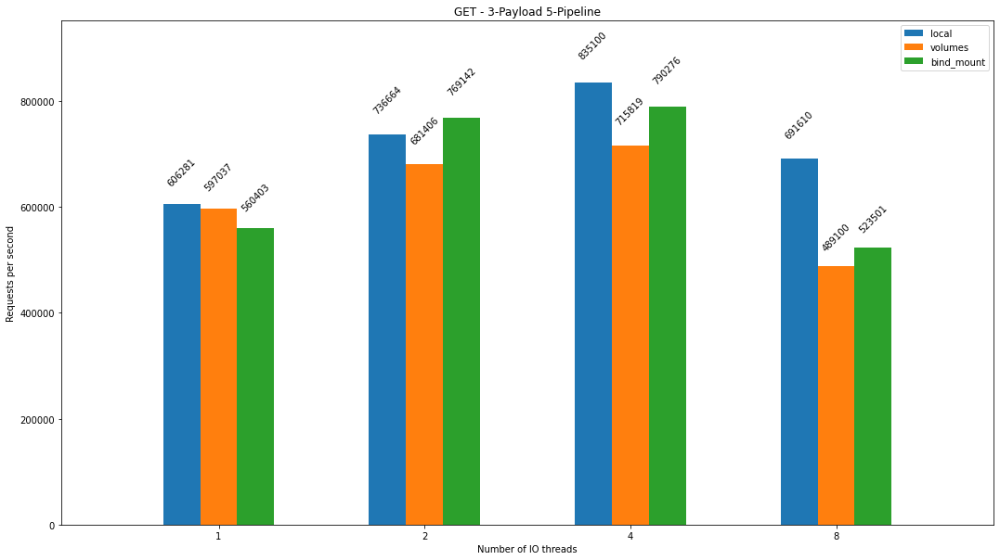

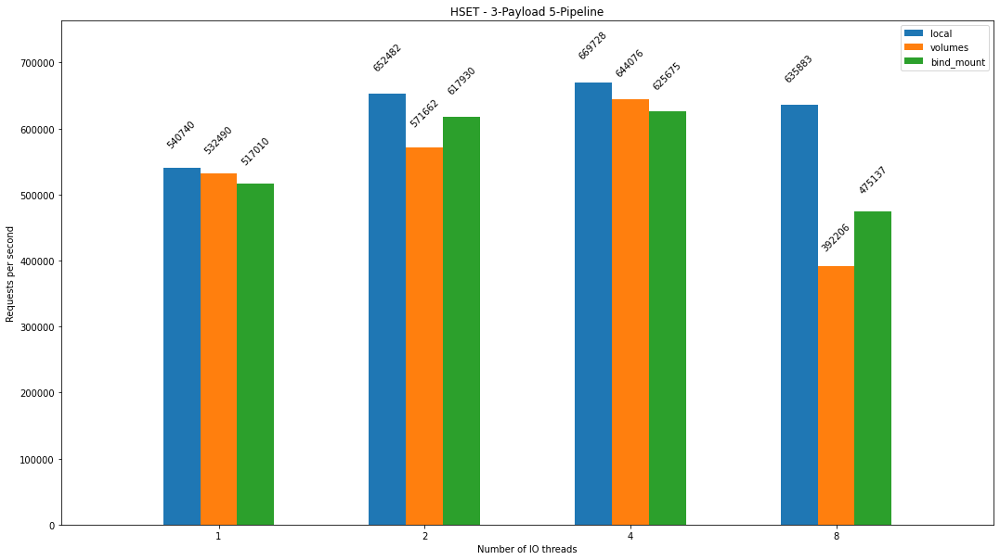

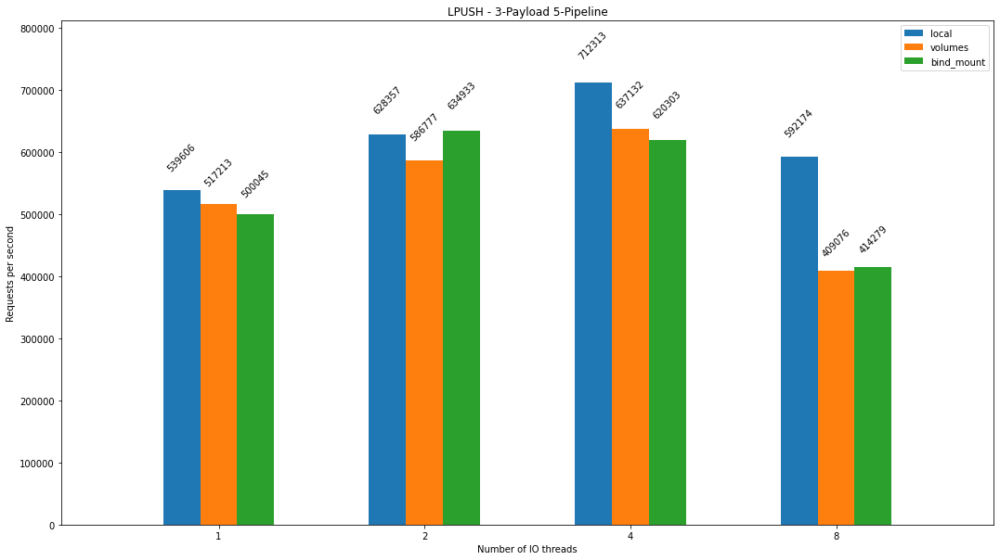

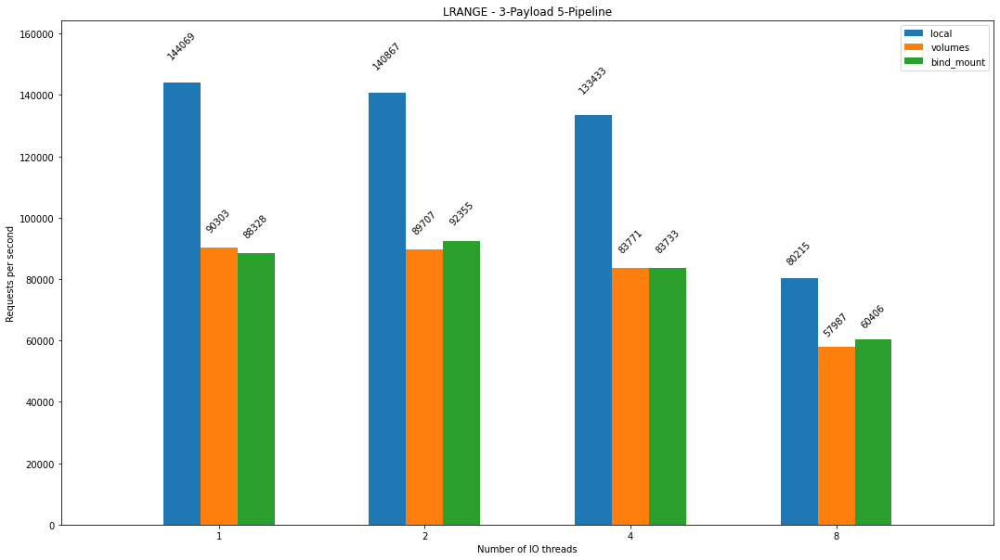

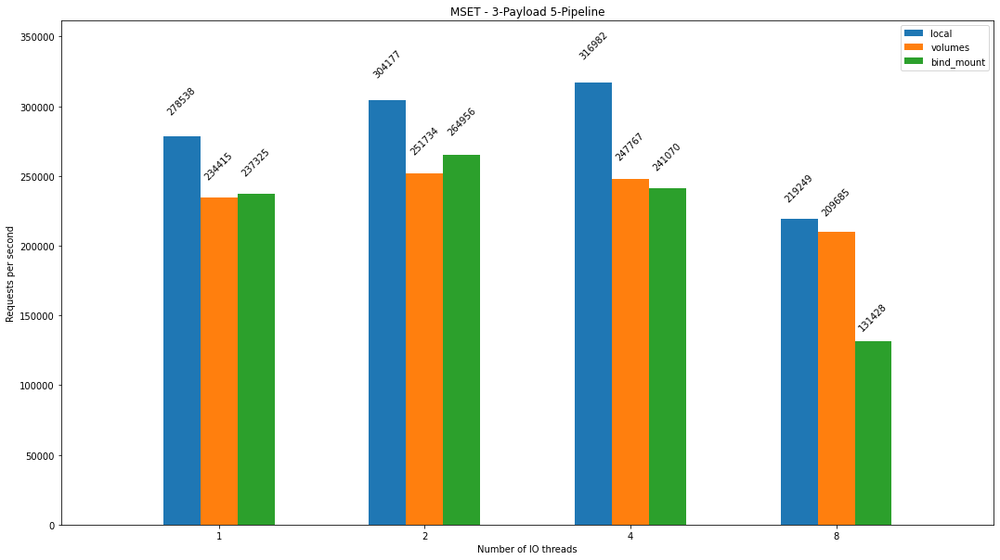

8


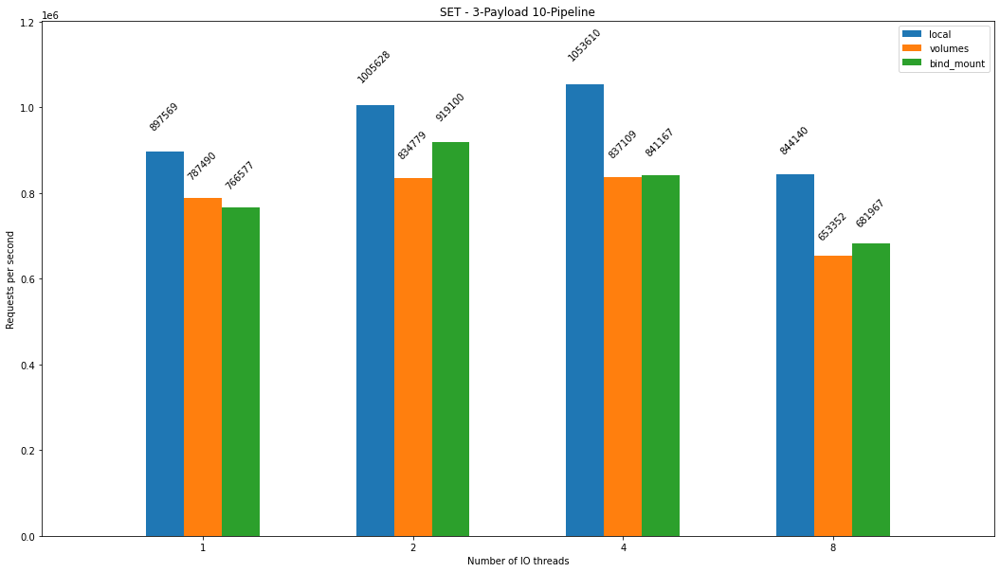

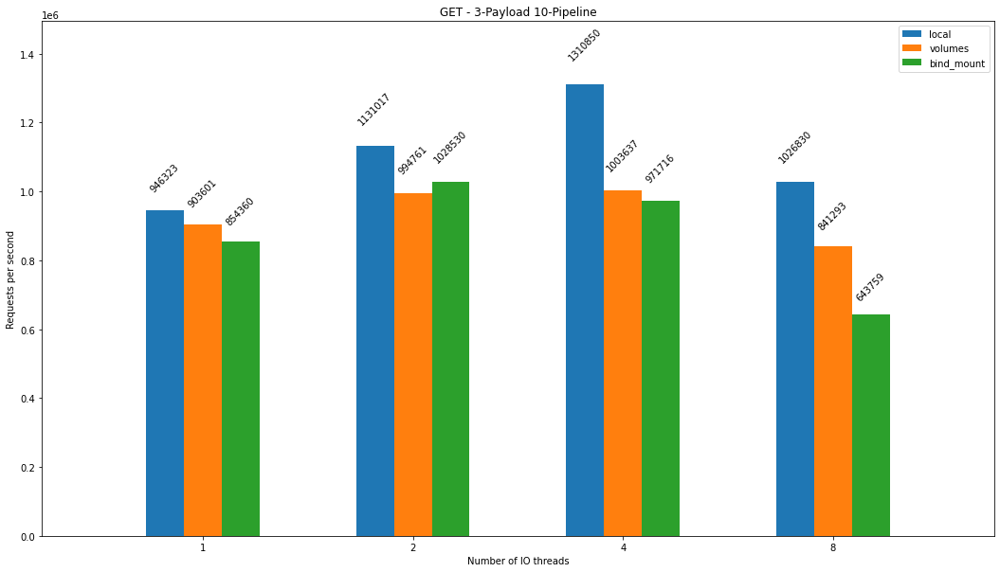

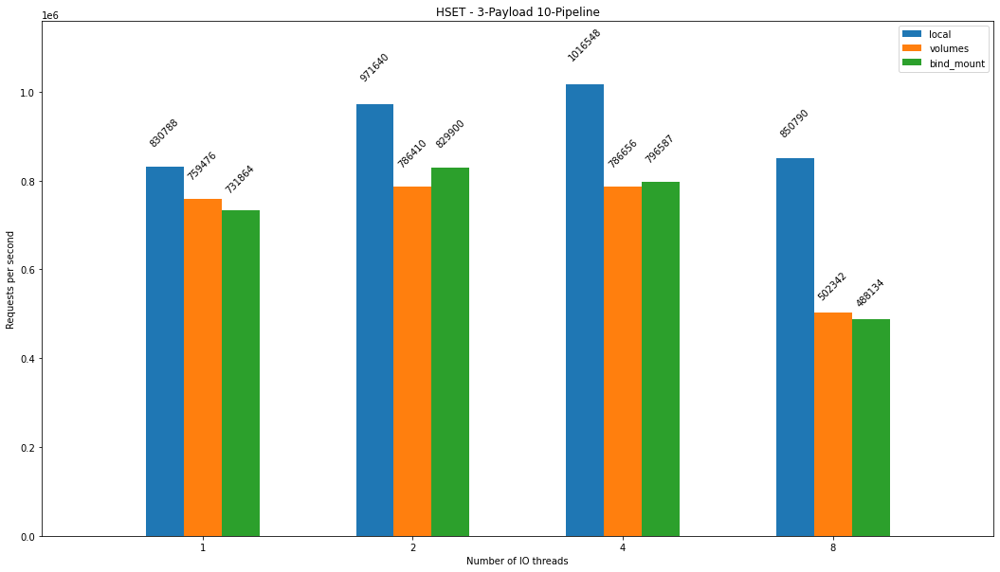

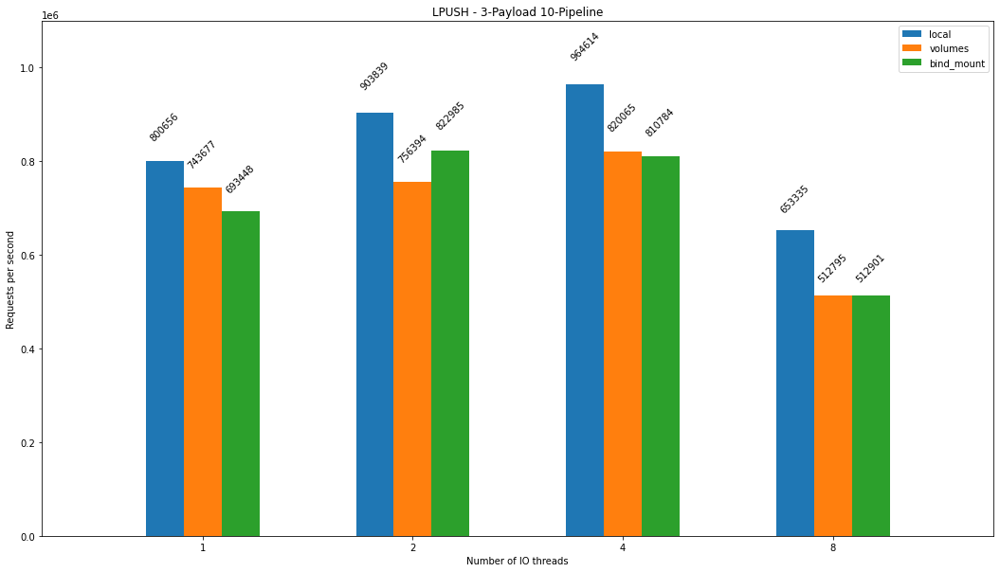

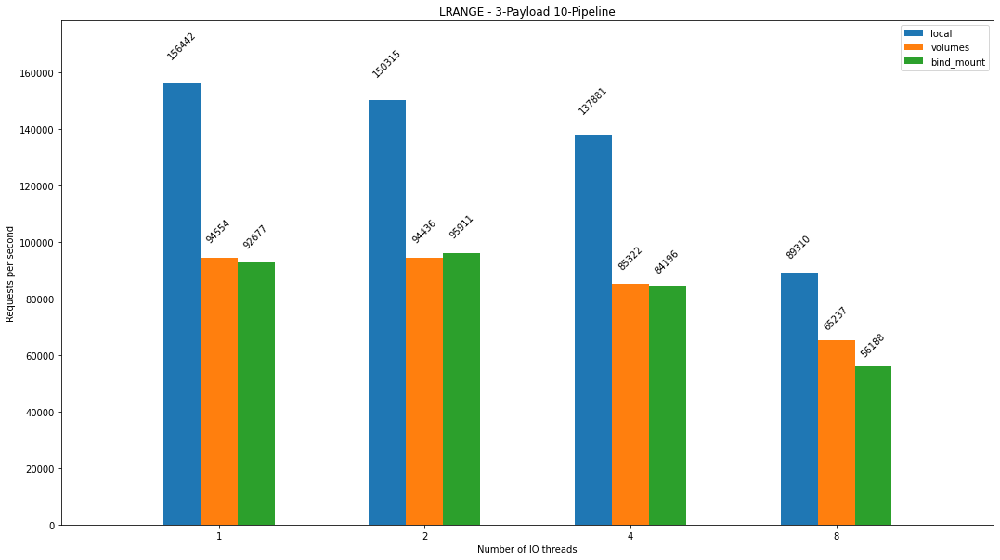

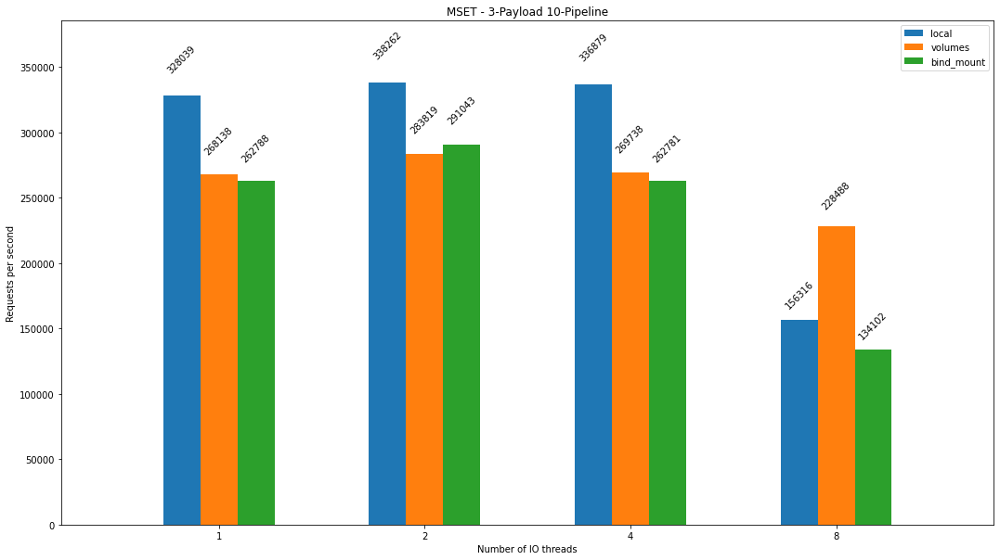

8


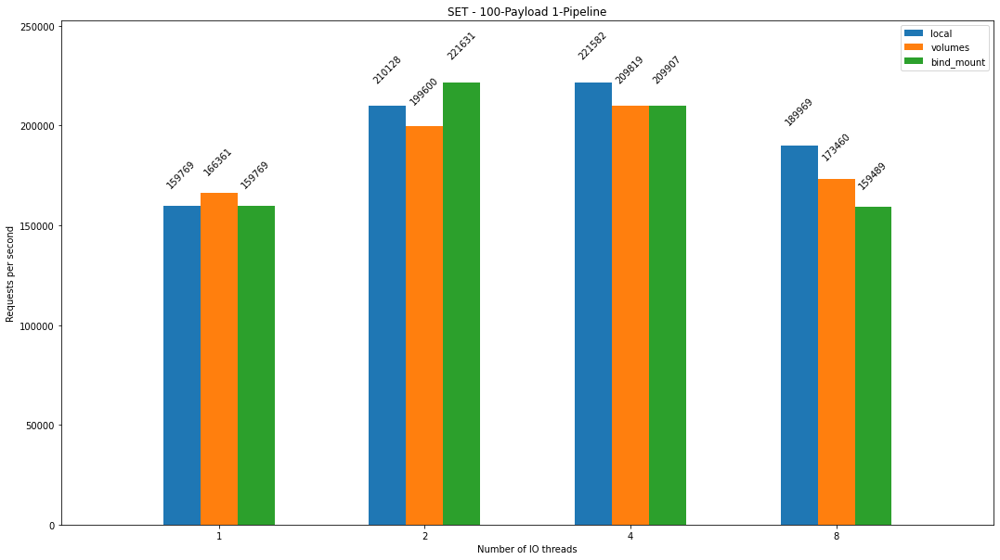

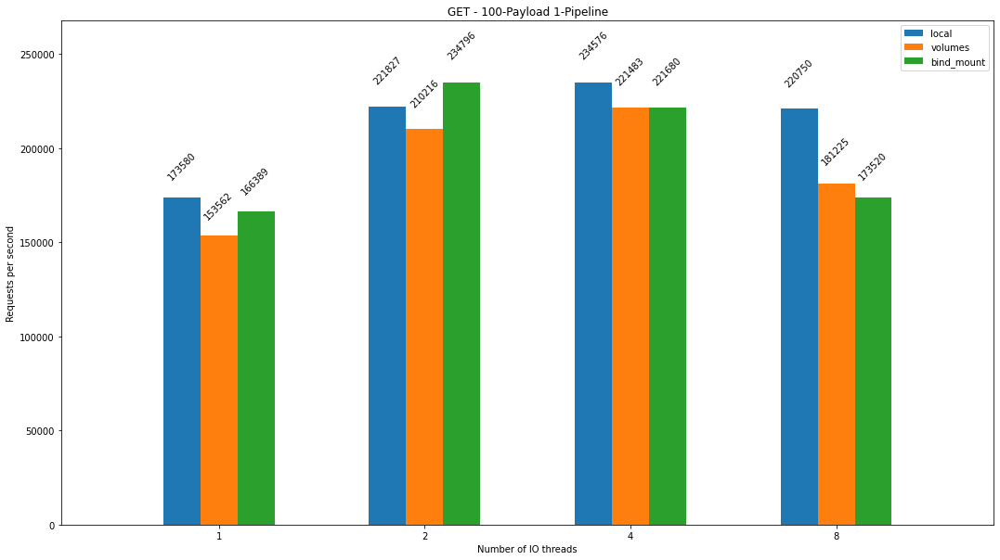

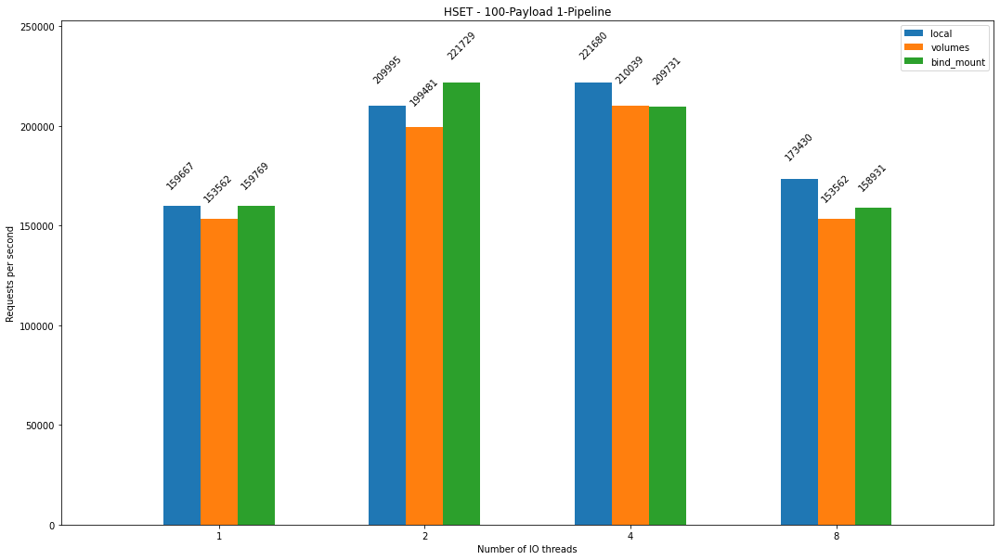

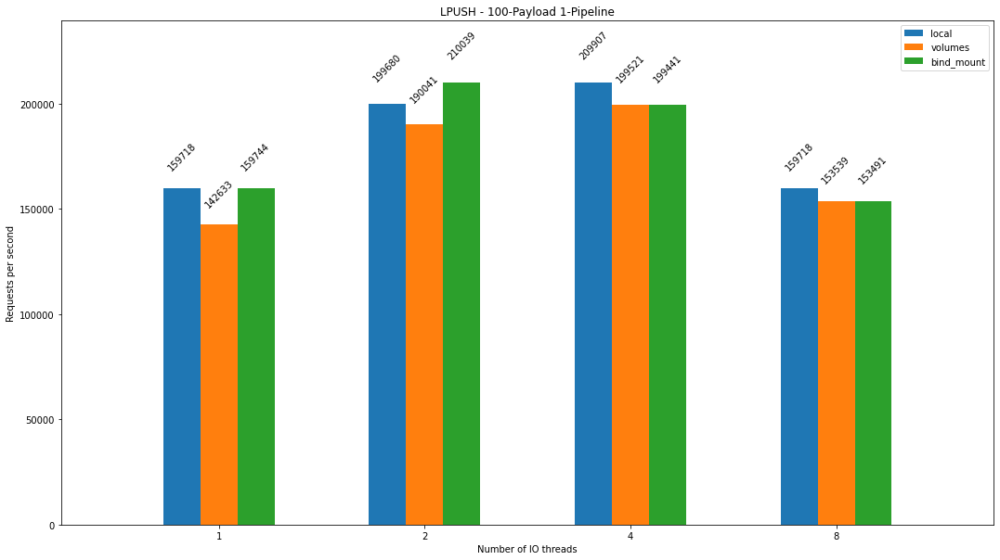

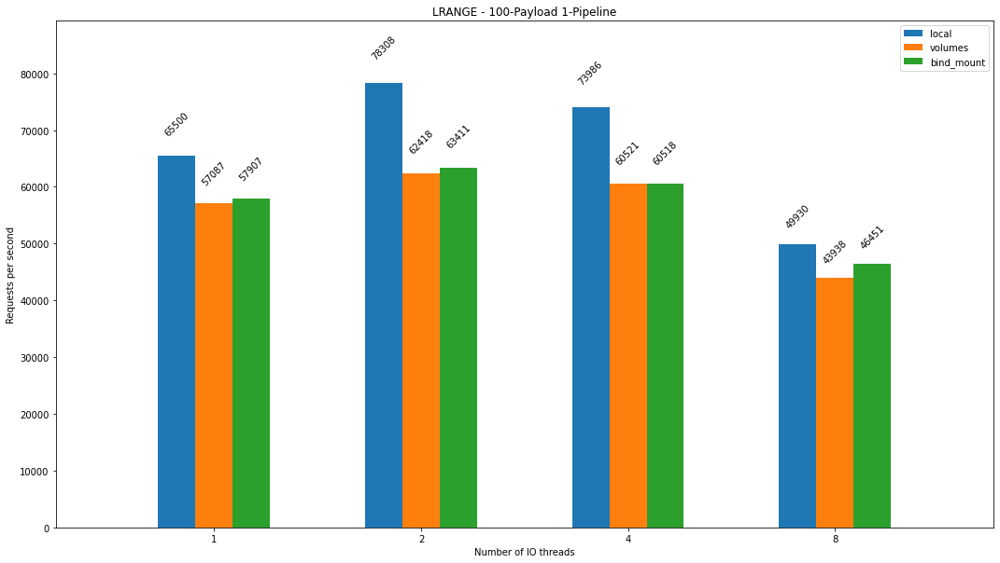

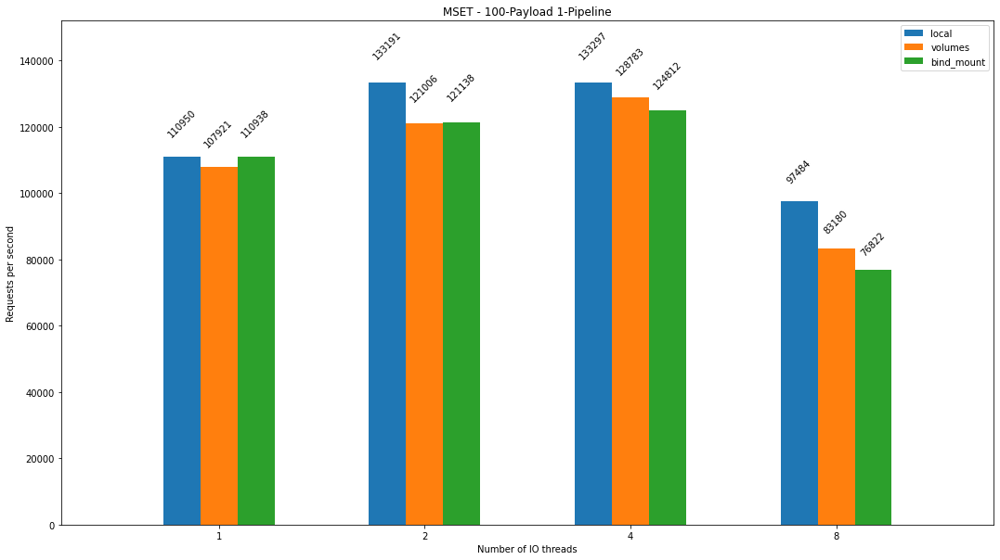

8


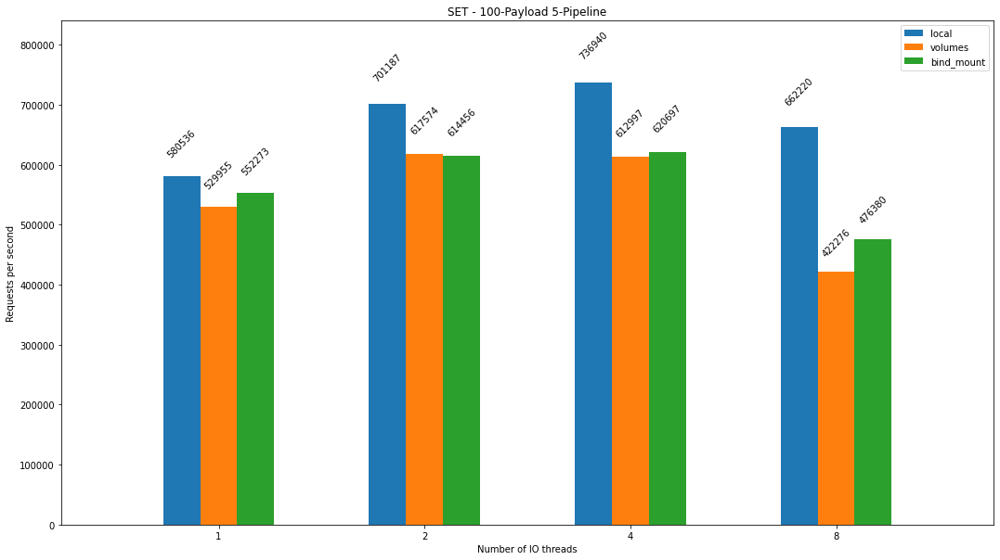

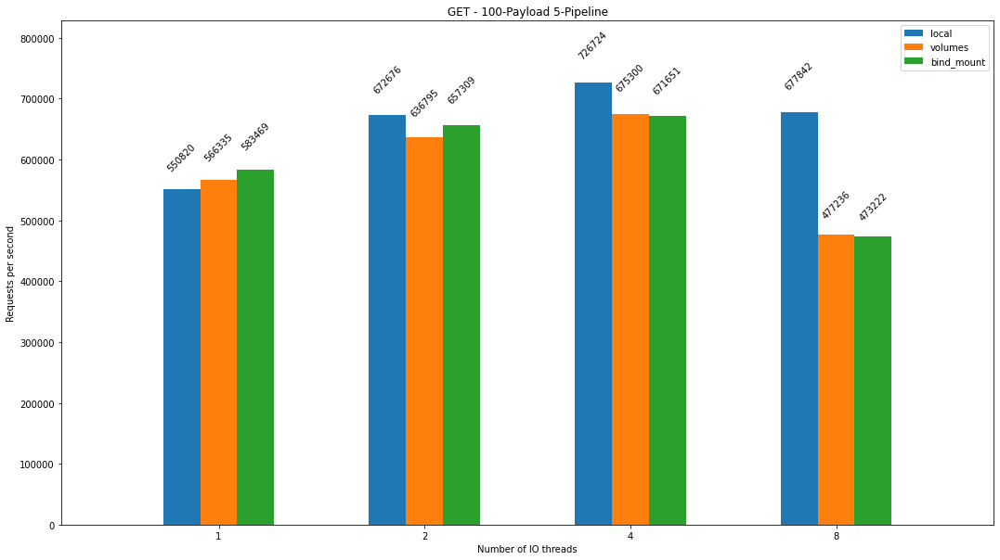

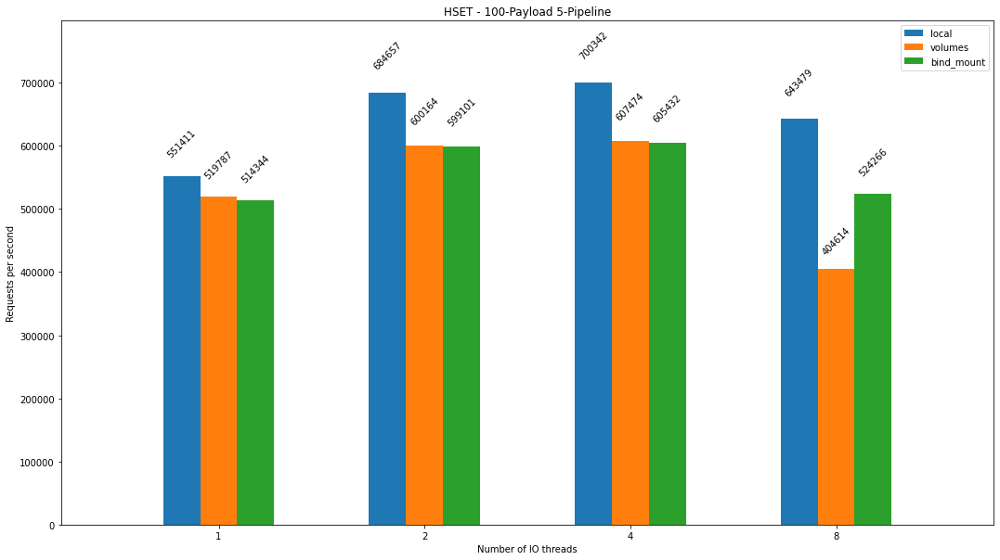

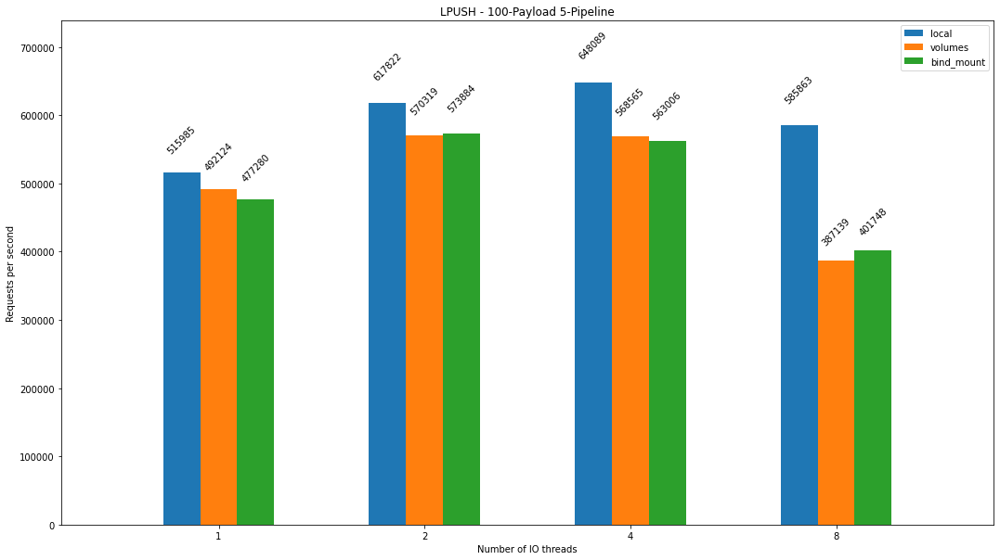

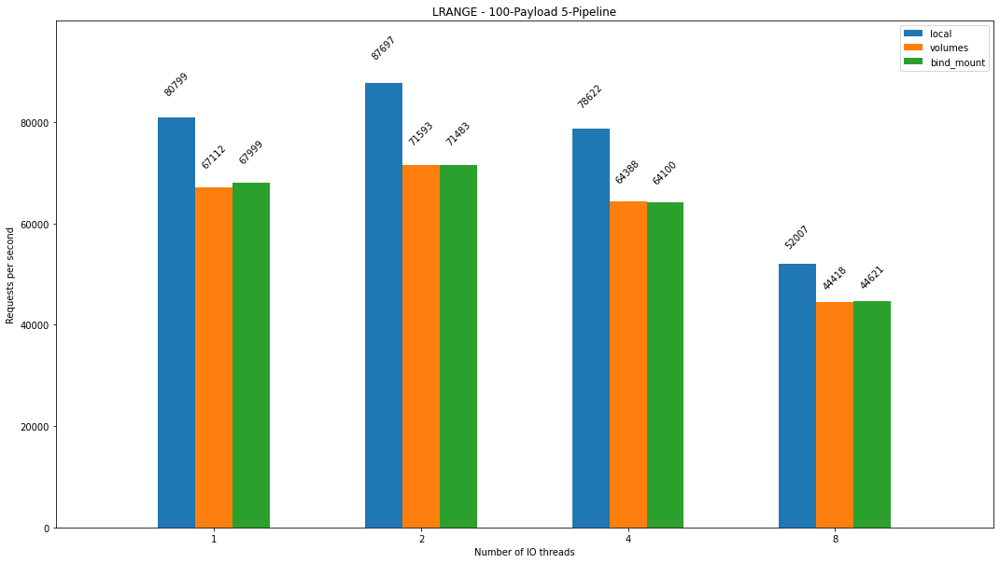

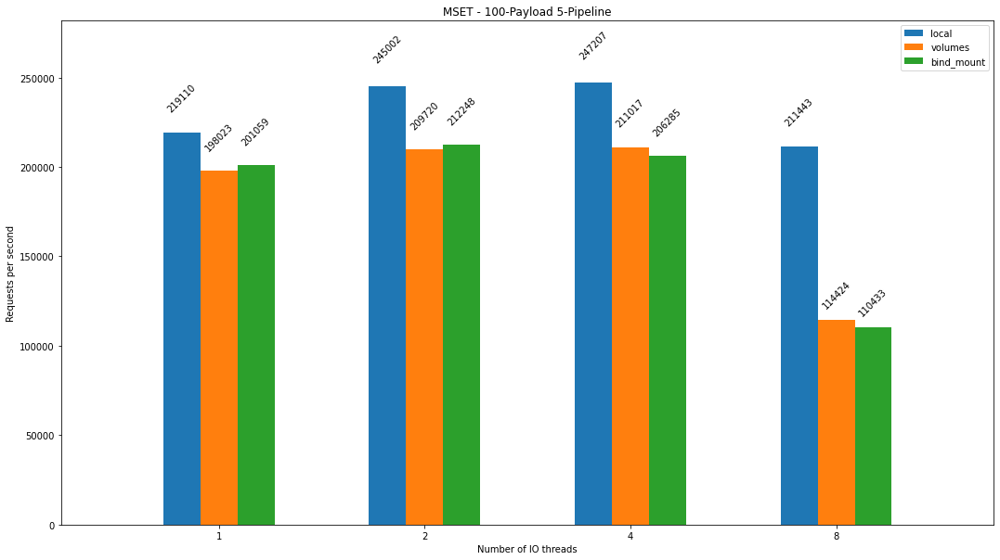

8


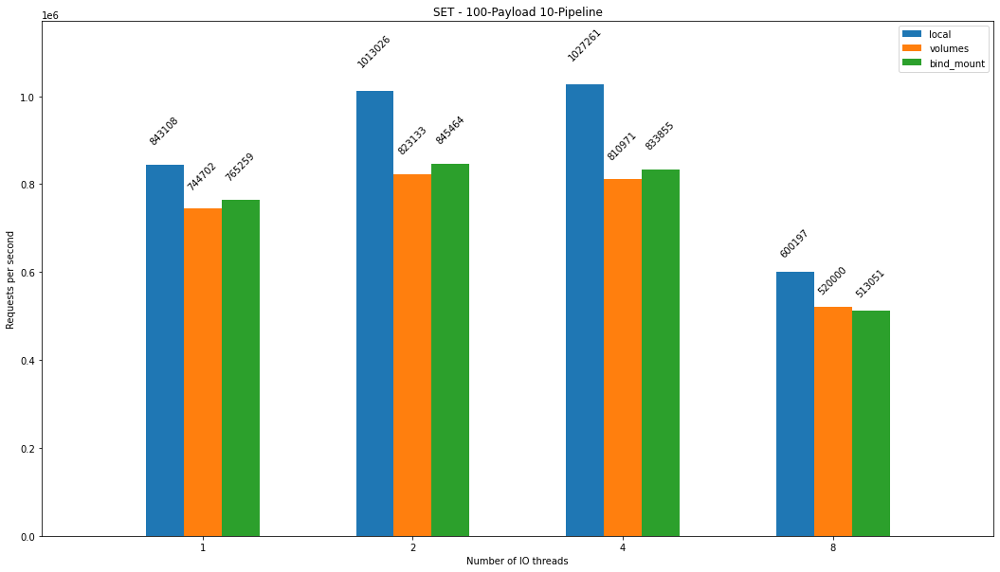

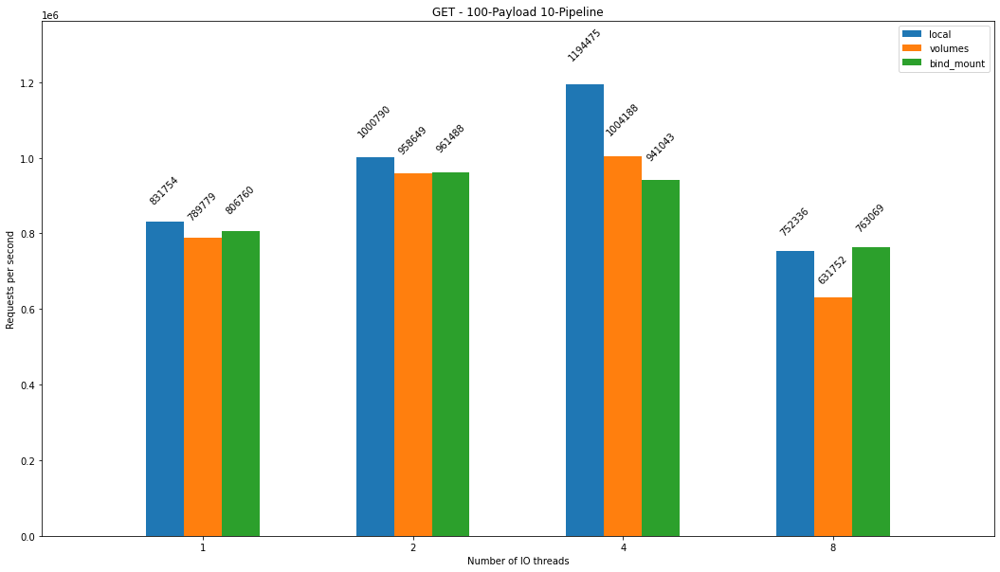

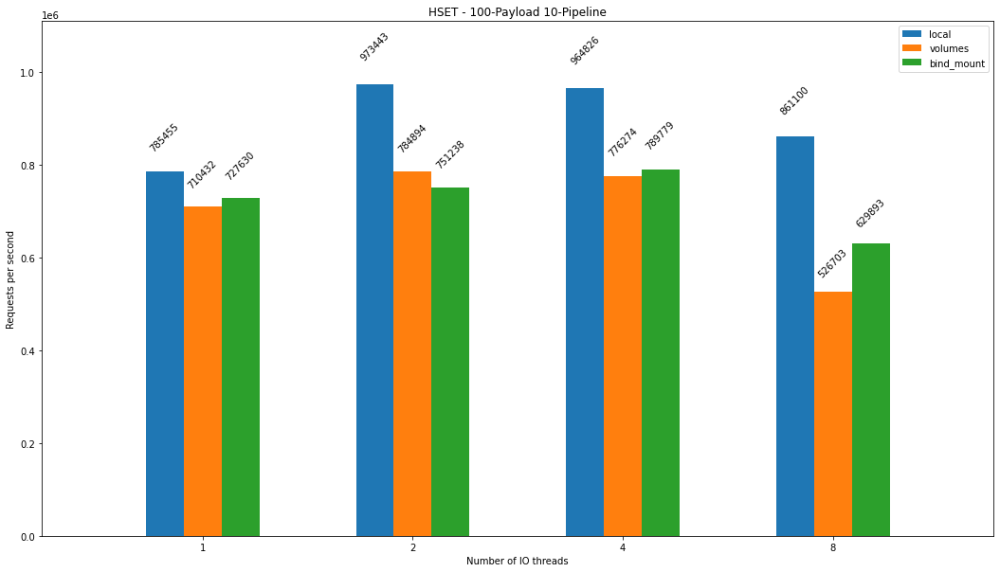

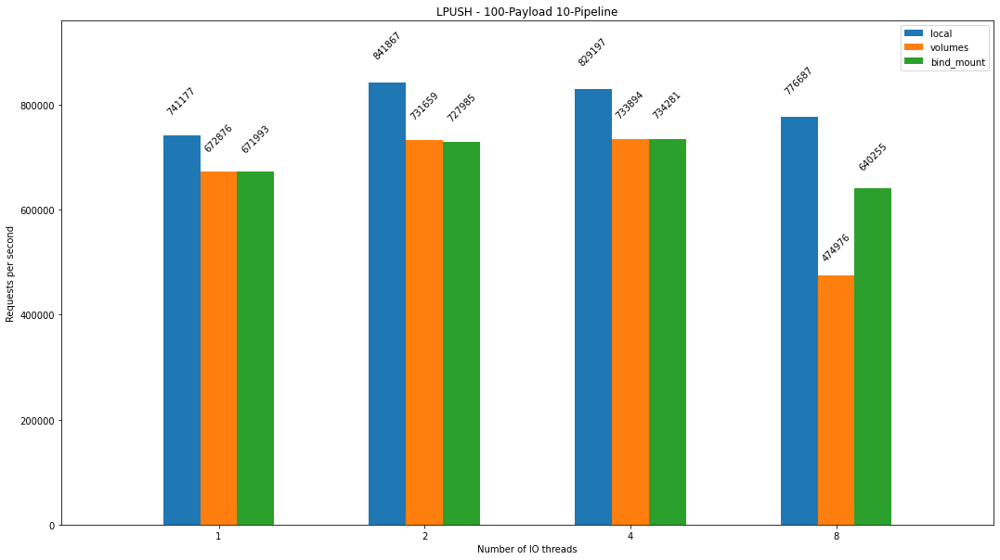

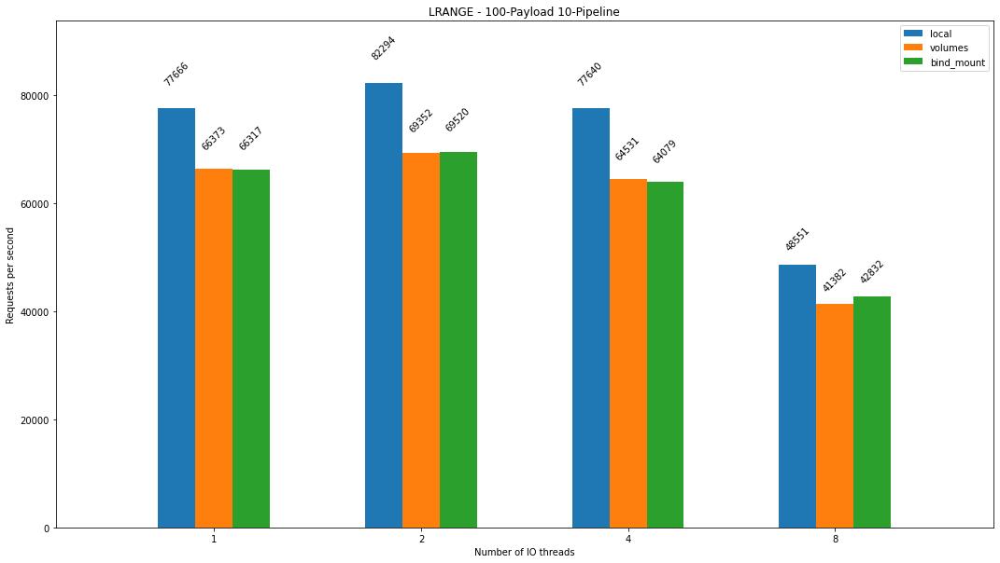

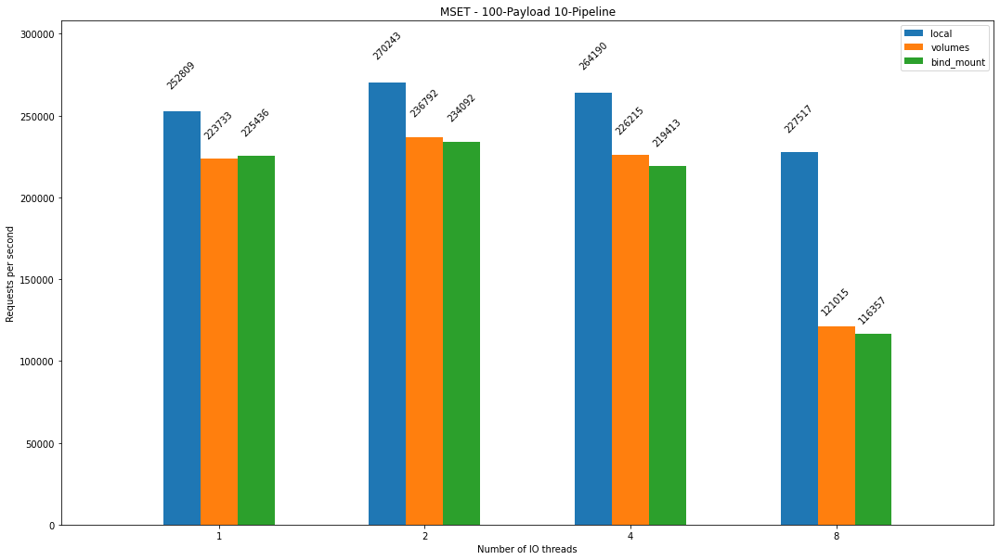

8


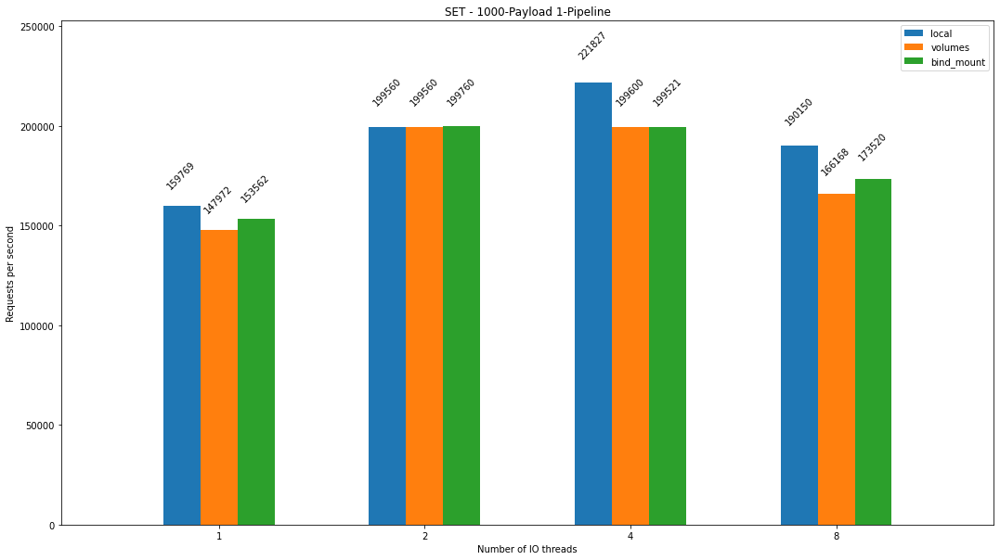

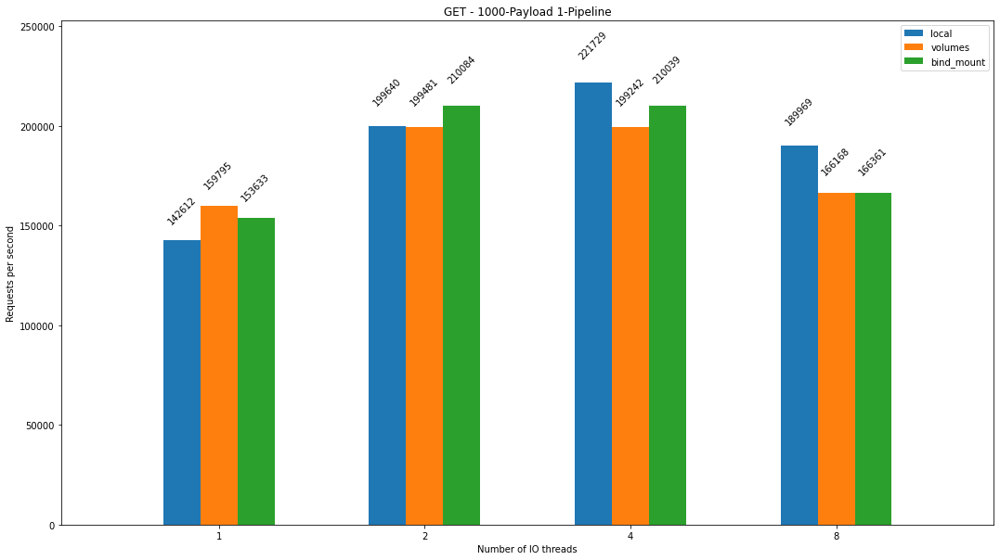

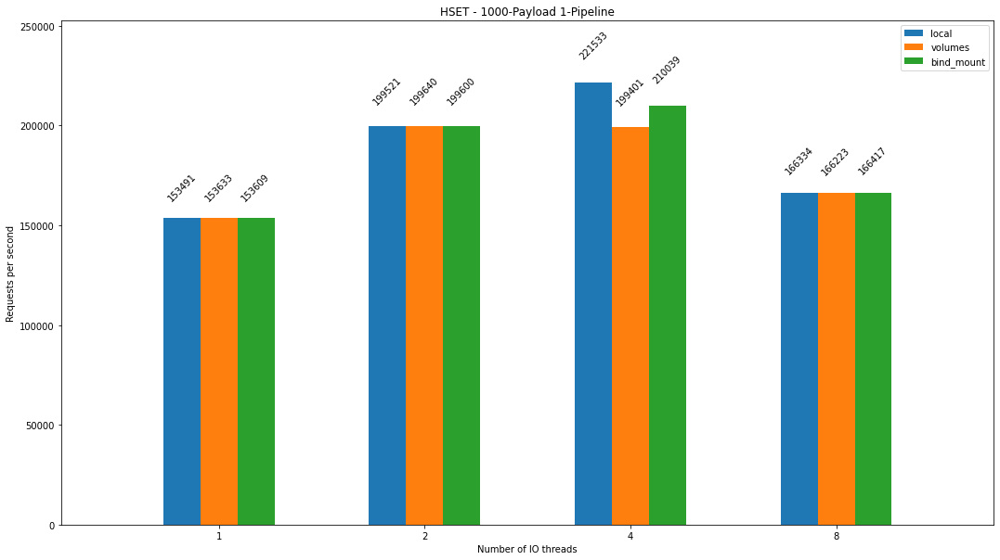

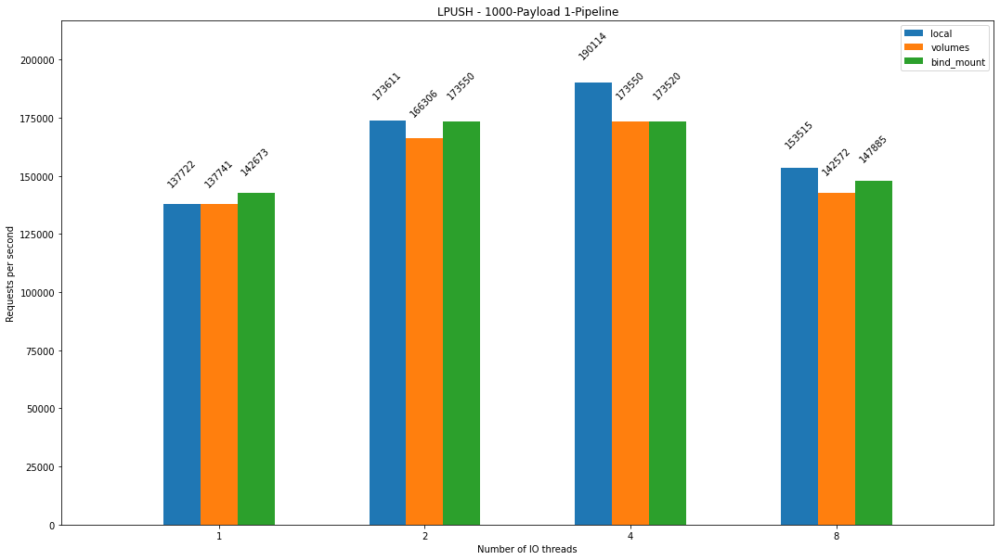

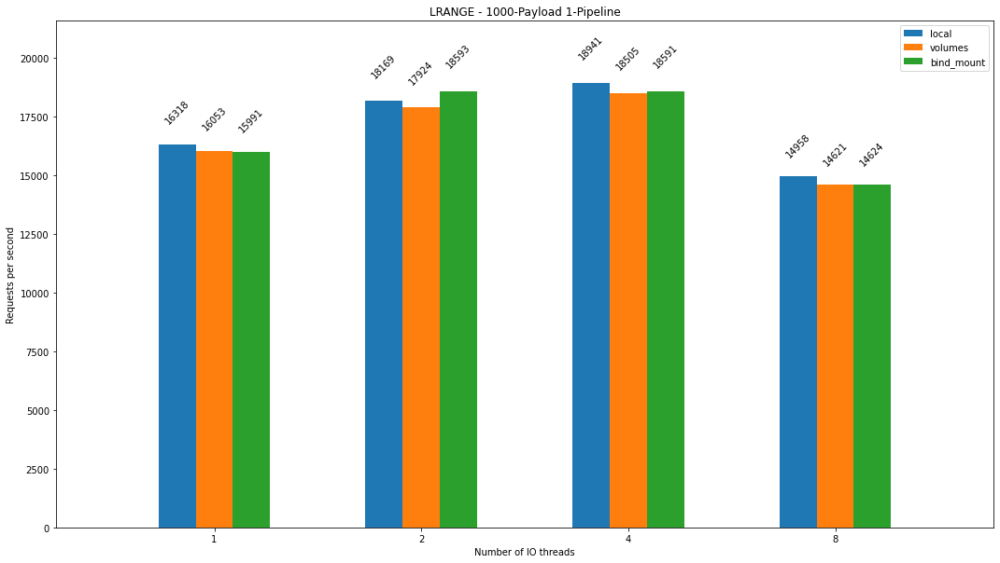

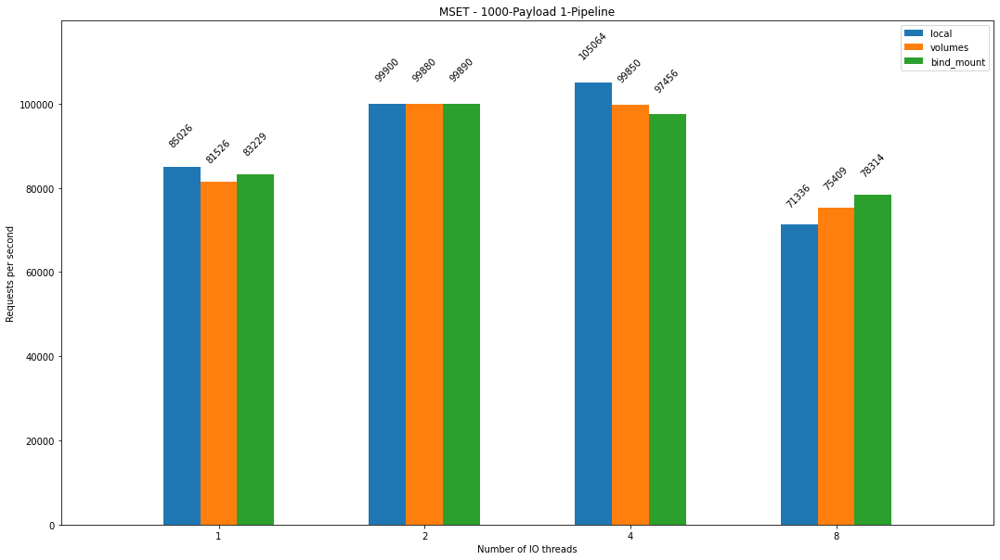

8


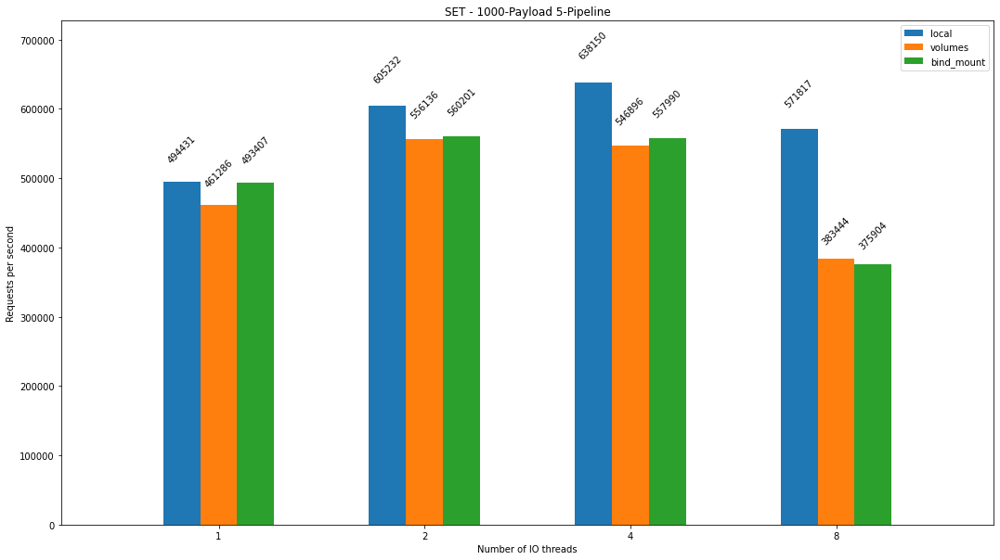

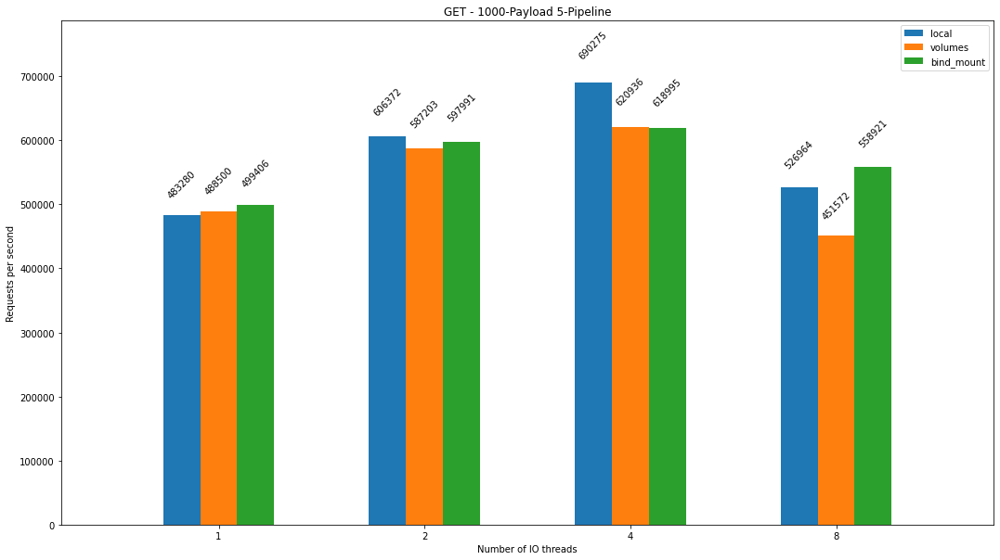

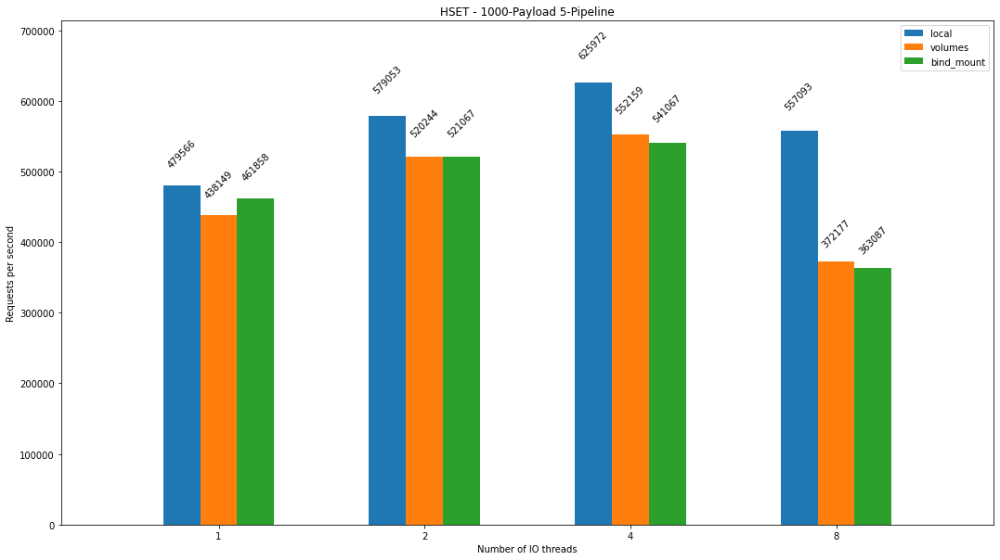

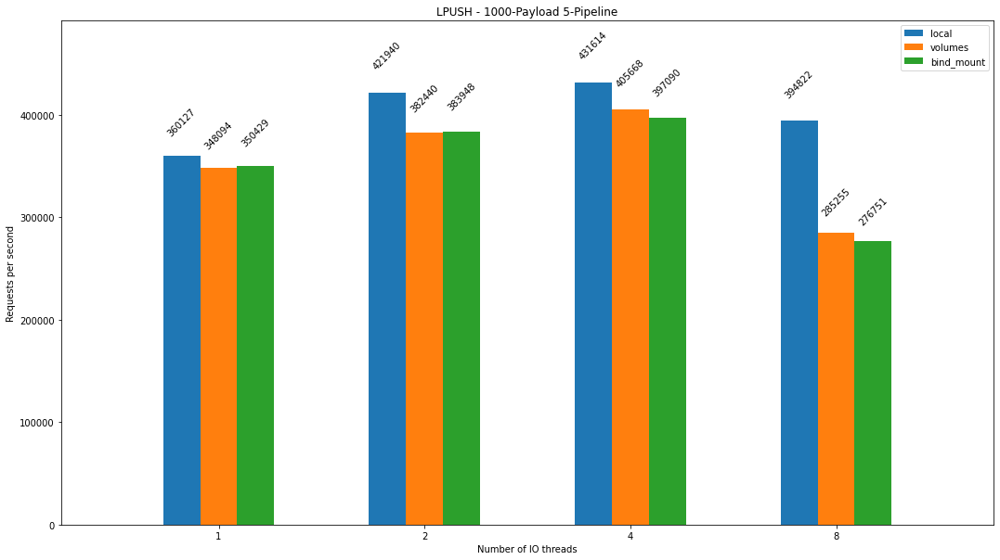

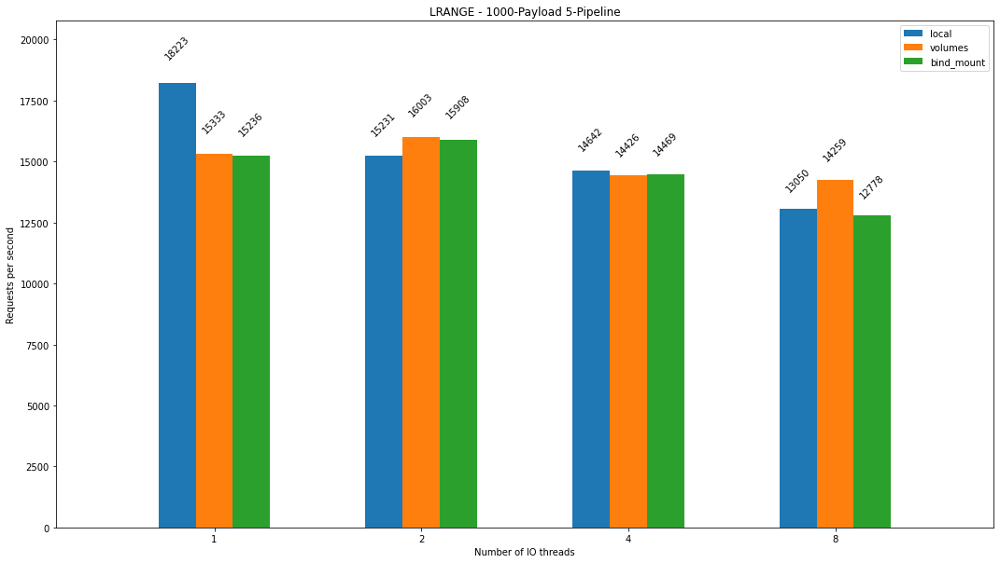

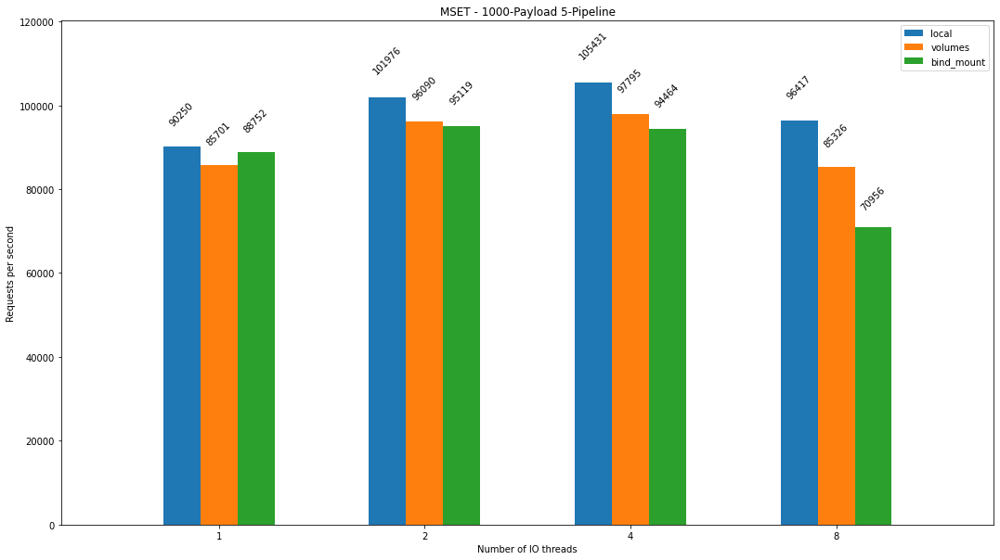

8


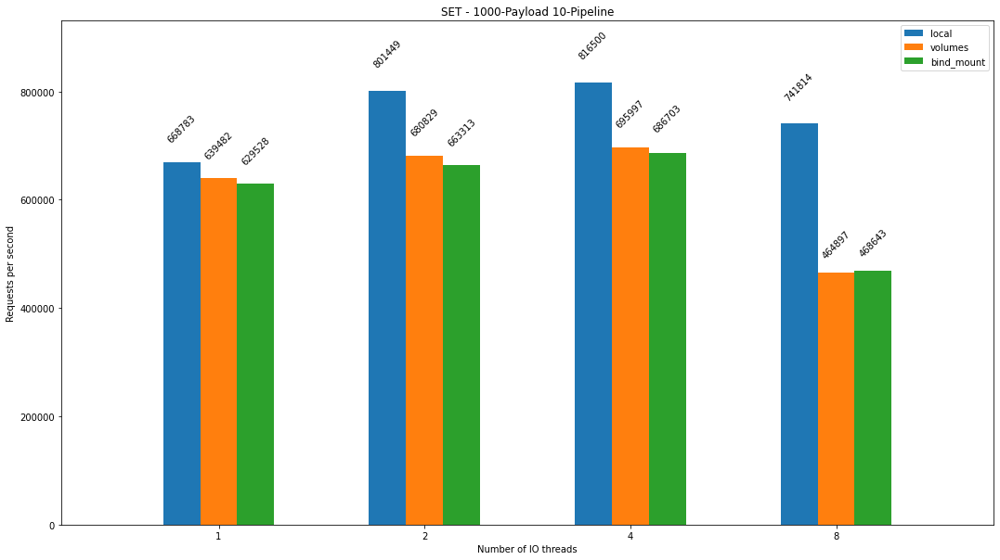

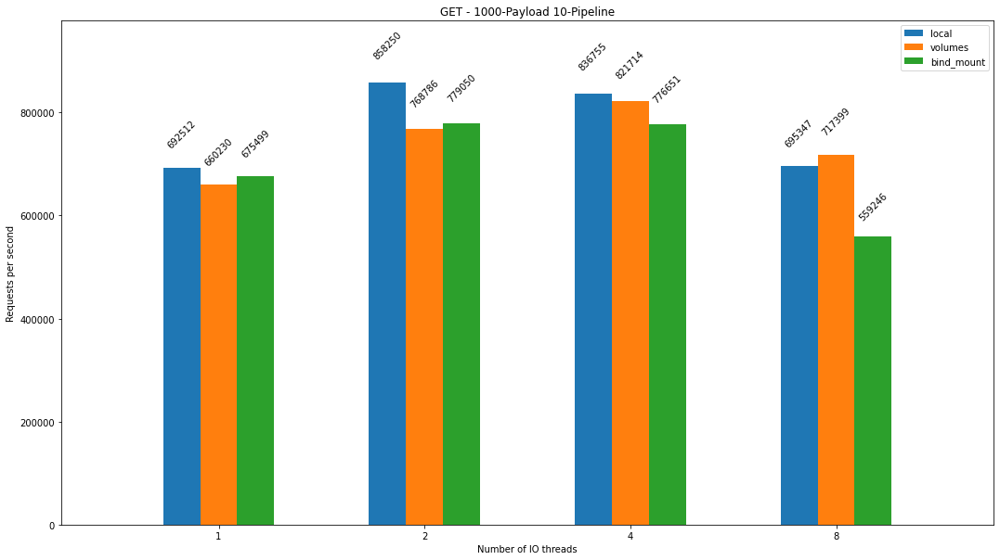

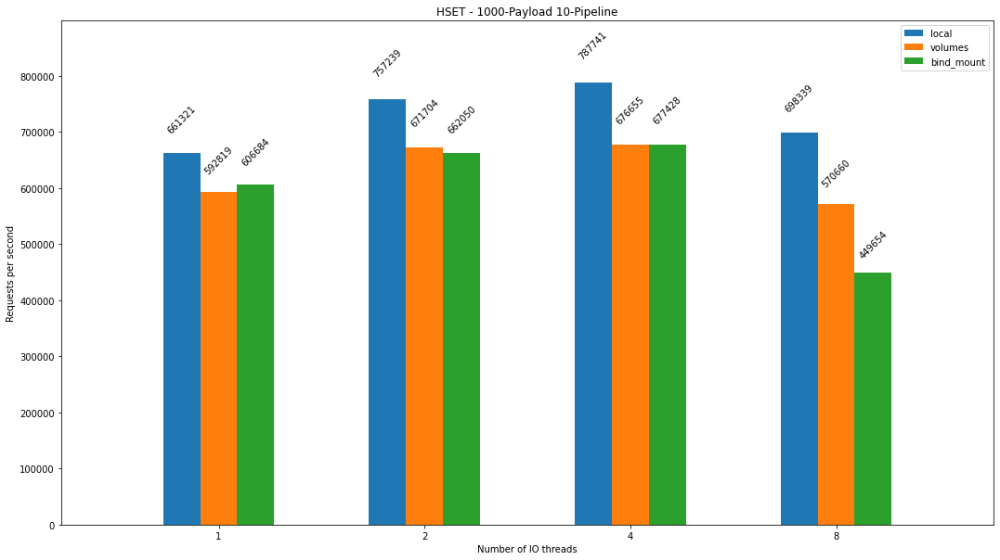

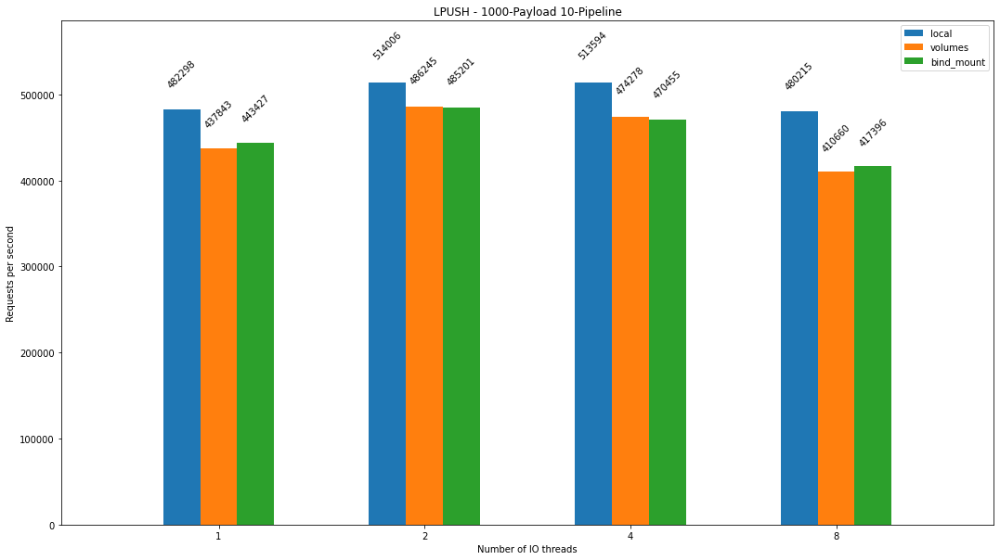

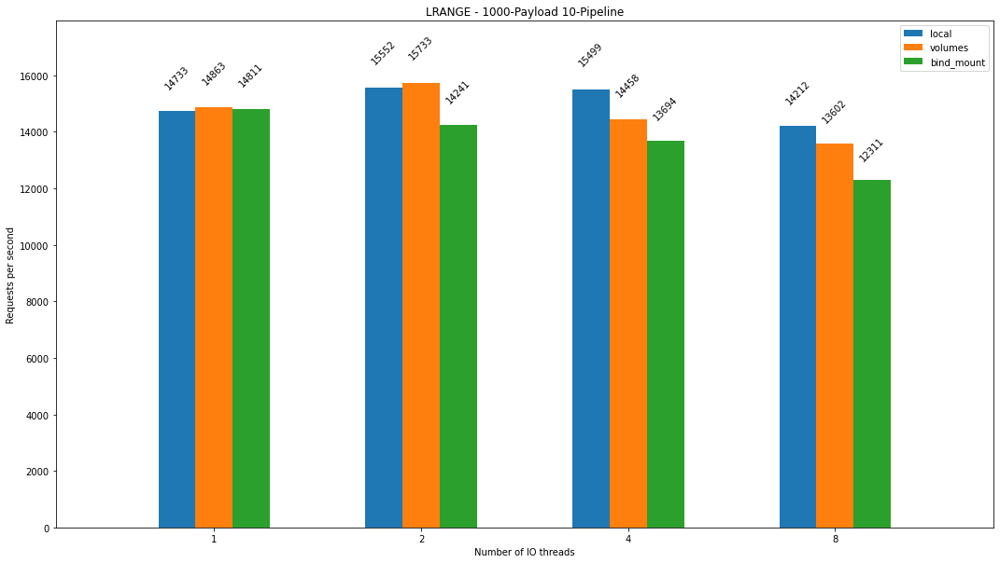

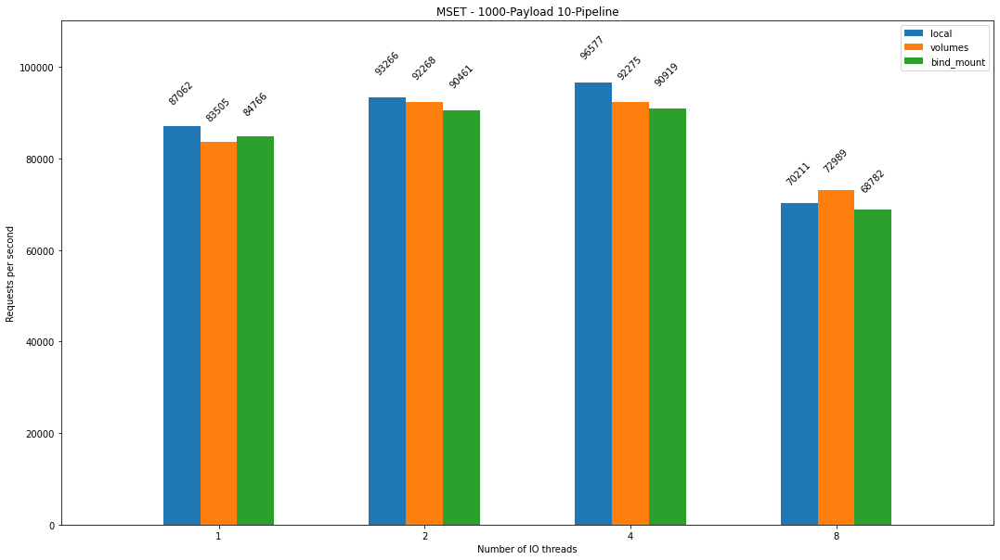

In [32]:
threads = ["1", "2", "4", "8"]

for payload in ["3", "100", "1000"]:
    for pipeline in ["1", "5", "10"]:
        local = []
        volumes = []
        bindMounts = []
        for i in range(len(threads)):
            fileName = "iothreads_{}_pipeline_{}_connections_{}_payload_{}.txt".format(threads[i], pipeline, "512", payload)
            local.append([])
            volumes.append([])
            bindMounts.append([])
            for folder in folders:
                if folder=="localResults":
                    with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                        for line in f:
                            if "requests per second" in line:
                                data = line.split(" ")
                                local[-1].append(float(data[0]))
                elif folder=="volumeResults":
                    with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                        for line in f:
                            if "requests per second" in line:
                                data = line.split(" ")
                                volumes[-1].append(float(data[0]))
                elif folder=="bindMountResults":
                    with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                        for line in f:
                            if "requests per second" in line:
                                data = line.split(" ")
                                bindMounts[-1].append(float(data[0]))

        plotData(local, volumes, bindMounts, threads[i], payload, pipeline)

In [26]:
folders = ["localResults", "volumeResults", "bindMountResults"]
types = ["SET", "GET", "HSET", "LPUSH", "LRANGE", "MSET"]
pLine = ["1", "5", "10"]
pLoad = ["3", "100", "1000"]
threads = ["1", "2", "4", "8"]
width = 0.18
ind = np.arange(4)

def autolabel(rects, ax):
    for rect in rects:
        h = rect.get_height()
        ax.text(rect.get_x()+rect.get_width()/2., 1.05*h, '%.2f'%h,
                ha='center', va='bottom', rotation=45)

def plotData(data, pipeline, thread):
    plt.figure(figsize=(20, 10))
    plt.xlabel("No of IO threads")
    plt.xticks((1,2,4,8))
    plt.ylabel("Time taken by 1000000 requests (seconds)")
    for pload in range(len(data)):
        for i in range(len(data[pload][0])):
            xvals = []
            yvals = []
            zvals = []
            for j in range(4):
                xvals.append(int(1000000/data[pload][0][j][i]))
                yvals.append(int(1000000/data[pload][1][j][i]))
                zvals.append(int(1000000/data[pload][2][j][i]))

            
            #ax = fig.add_subplot(111)
            '''rects1 = ax.bar(ind, xvals, width, color='tab:blue')
            rects2 = ax.bar([i+width for i in ind], yvals, width, color='tab:orange')
            rects3 = ax.bar([i+width*2 for i in ind], zvals, width, color='tab:green')
            ax.set_xlabel("Number of IO threads")
            ax.set_ylabel("Time taken by 1000000 requests (seconds)")
            ax.set_xticks([i+width for i in ind])
            ax.set_xticklabels((1,2,4,8))
            ax.legend((rects1[0], rects2[0], rects3[0]), ("local", "volumes", "bind_mount"))
            plt.title(types[i] + " - " + th + "-IO threads " + payload + "-Payload " + pipeline + "-Pipeline")
            autolabel(rects1, ax)
            autolabel(rects2, ax)
            autolabel(rects3, ax)
            plt.margins(0.12)'''
            plt.plot(ind, xvals, "--", label="Local - " + types[i] + " - payload of " + pLoad[pload] + " bytes, 512 connections, pipelining of "+ pipeline + " commands and "+thread + " threads")
            plt.plot(ind, yvals, "--", label="Volume - " + types[i] + " - payload of " + pLoad[pload] + " bytes, 512 connections, pipelining of "+ pipeline + " commands and "+thread + " threads")
            plt.plot(ind, xvals, "--", label="BindMount - " + types[i] + " - payload of " + pLoad[pload] + " bytes, 512 connections, pipelining of "+ pipeline + " commands and "+thread + " threads")
    plt.legend()
    plt.show()

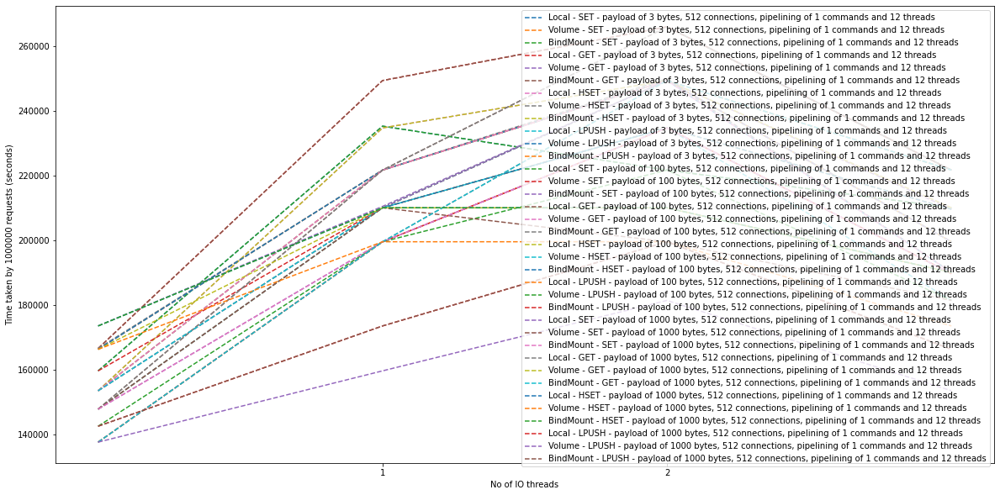

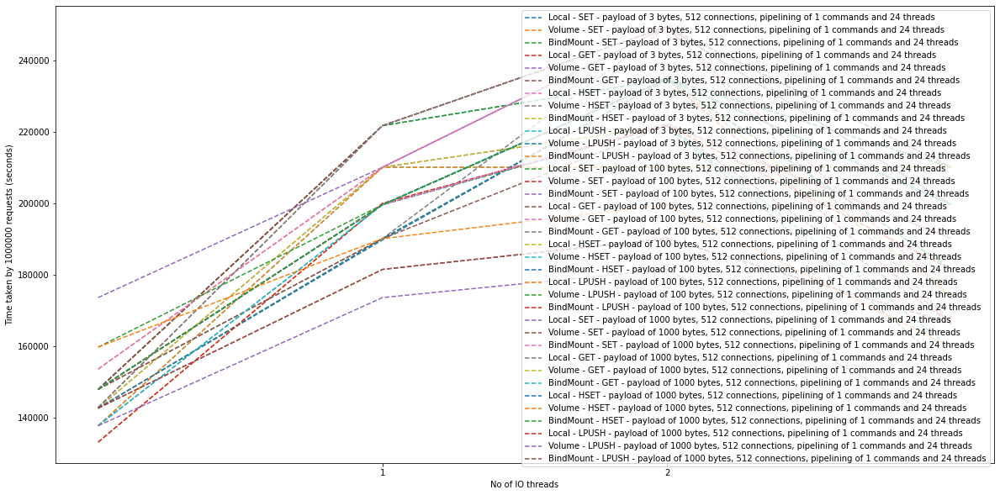

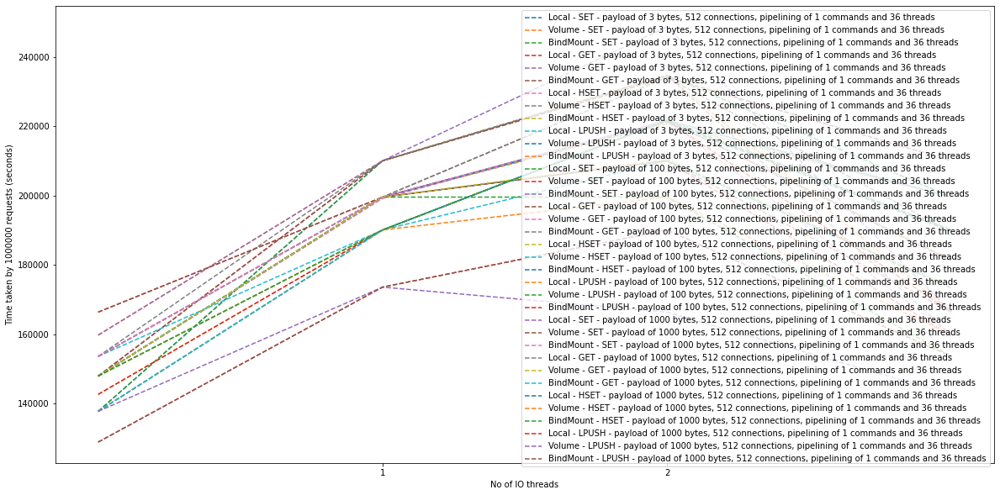

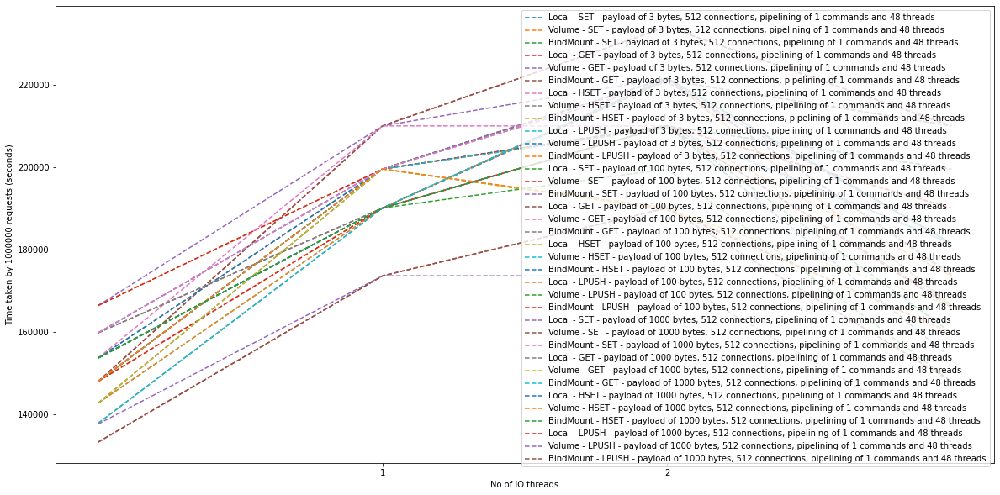

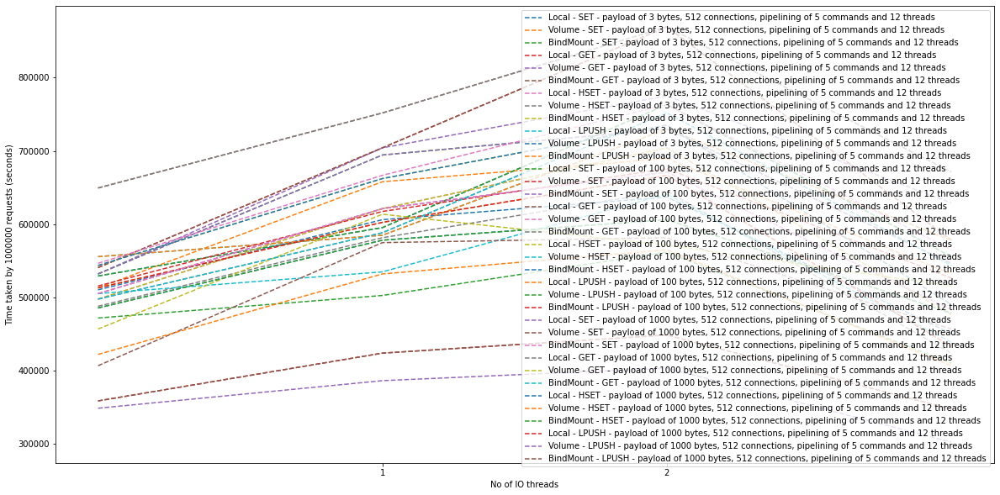

...

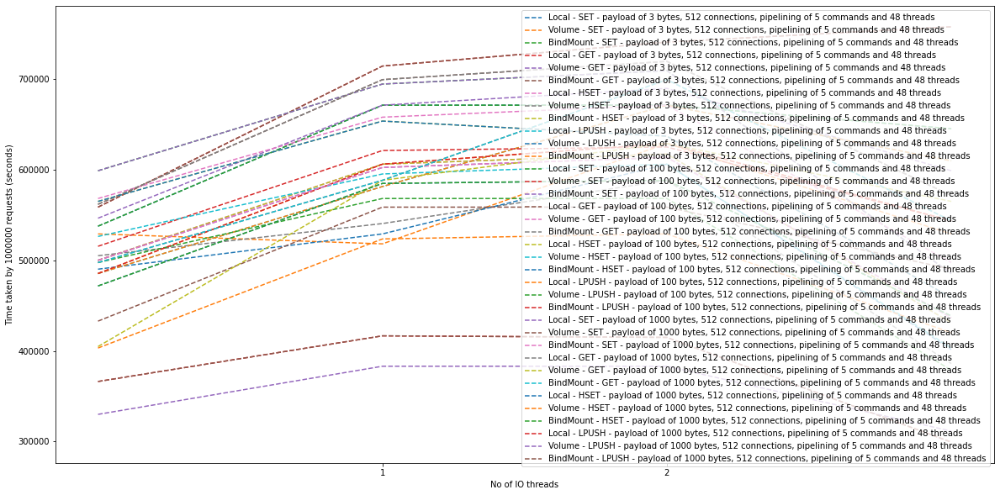

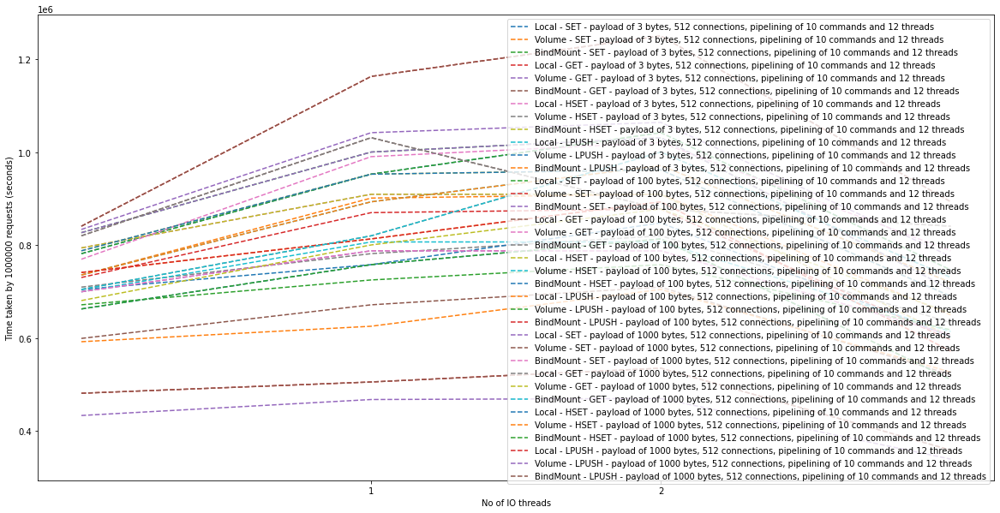

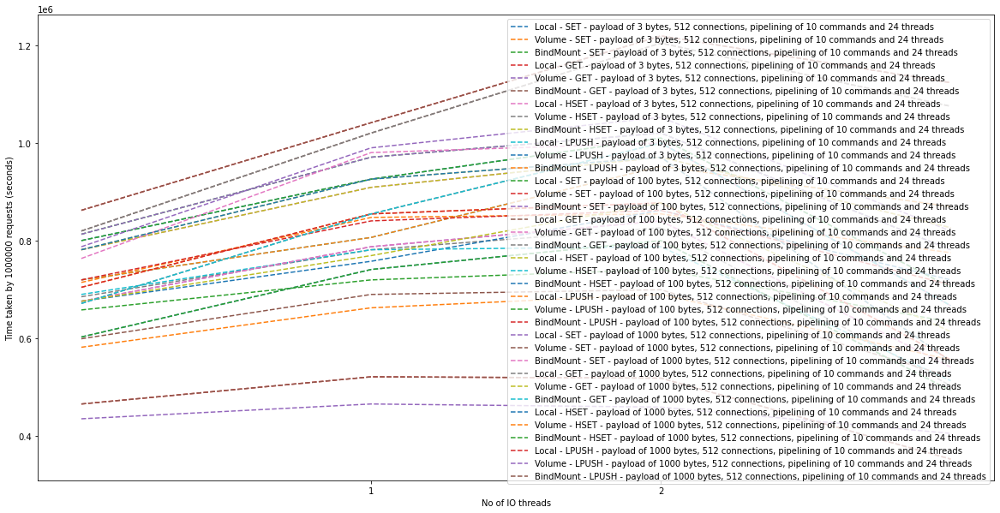

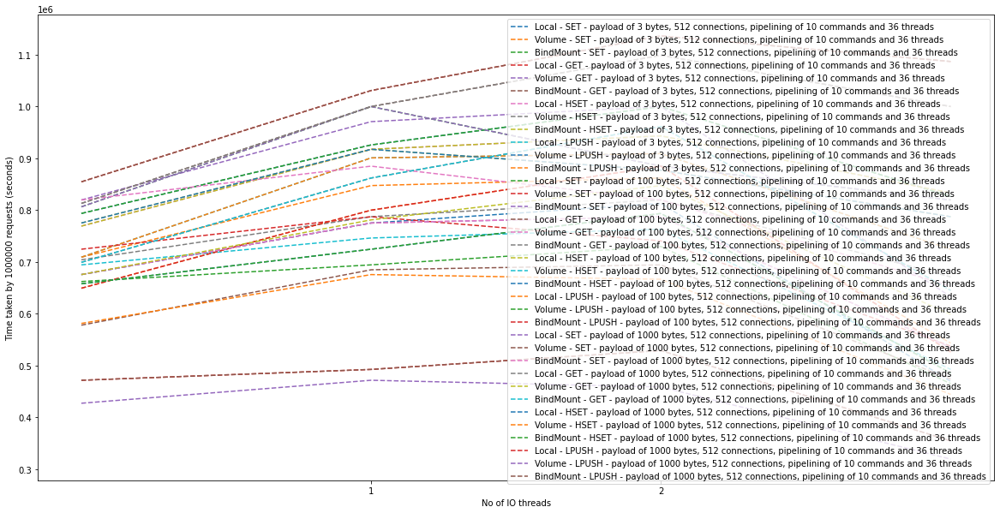

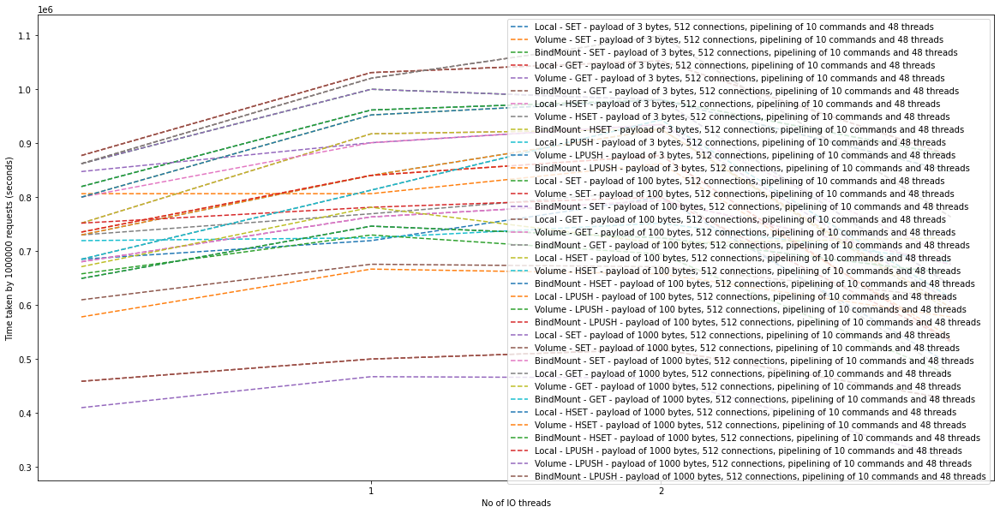

In [27]:
threads = ["1", "2", "4", "8"]

for pipeline in ["1", "5", "10"]:
    for th in ["12", "24", "36", "48"]:
        totalResults = []
        for payload in ["3", "100", "1000"]:
            local = []
            volumes = []
            bindMounts = []
            for i in range(len(threads)):
                fileName = "iothreads_{}_pipeline_{}_connections_{}_payload_{}_threads_{}.txt".format(threads[i], pipeline, "512", payload, th)
                local.append([])
                volumes.append([])
                bindMounts.append([])
                for folder in folders:
                    if folder=="localResults":
                        with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                            readThis = False
                            for line in f:
                                if readThis:
                                    data = line.split(" ")
                                    local[-1].append(float(data[6]))
                                    readThis=False
                                if "======" in line:
                                    readThis = True
                    elif folder=="volumeResults":
                        with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                            readThis = False
                            for line in f:
                                if readThis:
                                    data = line.split(" ")
                                    volumes[-1].append(float(data[6]))
                                    readThis=False
                                if "======" in line:
                                    readThis = True
                    elif folder=="bindMountResults":
                        with open(os.getcwd() + "/" + folder + "/" + fileName, 'r') as f:
                            readThis = False
                            for line in f:
                                if readThis:
                                    data = line.split(" ")
                                    bindMounts[-1].append(float(data[6]))
                                    readThis=False
                                if "======" in line:
                                    readThis = True
            totalResults.append([local, volumes, bindMounts])
        plotData(totalResults, pipeline, th)